In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import yfinance as yf
from sklearn.cluster import KMeans
from colorama import Fore, Style
import seaborn as sns
from sklearn.metrics import r2_score
sns.set(style='darkgrid')
import plotly.graph_objects as go
import pickle

import sys
sys.path.append('../src') 
from stock_strategy import stock_strategy, stock_regression

from scipy.stats import norm
from scipy.optimize import minimize
from scipy.optimize import fsolve, curve_fit

from kneed import KneeLocator

In [2]:
list_base = [
    'brk-b','cost','voo','xlk','unh','xlv','aapl','wmt','coke', 'race','msft','hesay', 'axp','googl',
    'abbv','lly','ma','inda',
    'pg','xlp','lmt', # stable, but not for long hold given low return
] 
list_swing = [
    'cat','itb','xlf','hd','jpm','smh',
    'fico','nvda','tsla','fbtc',
]
list_ref = ['gld', 'xle']
list_check = ['fngs', 'dis', 'hpq', 'cof']
list_robinhood_only = ['cmg', 'panw']

In [14]:
dict_to_lookat = {'base_stock': [], 'swing_stock': []}
for base_stock in list_base:
    stock = stock_strategy(base_stock)
    if stock.ticker['Close'].tolist()[0] / stock.df['high'].max() < 0.93:
        dict_to_lookat['base_stock'].append(base_stock)
for swing_stock in list_swing:
    stock = stock_strategy(swing_stock)
    if stock.ticker['Close'].tolist()[0] / stock.df['high'].max() < 0.86:
        dict_to_lookat['swing_stock'].append(swing_stock)     
print(dict_to_lookat)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%********

{'base_stock': ['brk-b', 'cost', 'unh', 'xlv', 'race', 'msft', 'hesay', 'abbv', 'lly', 'inda', 'pg', 'xlp', 'lmt'], 'swing_stock': ['itb', 'fico', 'tsla']}


## Base

[*********************100%***********************]  1 of 1 completed


* Current stock price: 453.56
* Recent high: 491.67
* Current stock price is at 92.25% of recent high
Latest 20 Day MA: 457.2
Latest Lower Bollinger Band, 20MA: 444.63
Latest Higher Bollinger Band, 20MA: 469.77
Latest 50 Day MA: 462.07
Latest Lower Bollinger Band, 50MA: 437.34
Latest Higher Bollinger Band, 50MA: 486.8
Latest 50 Day EMA: 459.63
Latest 120 Day MA: 455.12
Latest 200 Day MA: 436.99
Latest 200 Day EMA: 436.94

Latest RSI: 43.35 
Latest MACD Divergence: -0.25 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 615.85
20MA break point: 457.39
20MA Lower Bollinger Band break point: 442.54
20MA Upper Bollinger Band break point: 472.25
50MA break point: 462.24
50MA Lower Bollinger Band break point: 435.39
50MA Upper Bollinger Band break point: 489.1
120MA break point: 455.14
200MA break point: 436.91


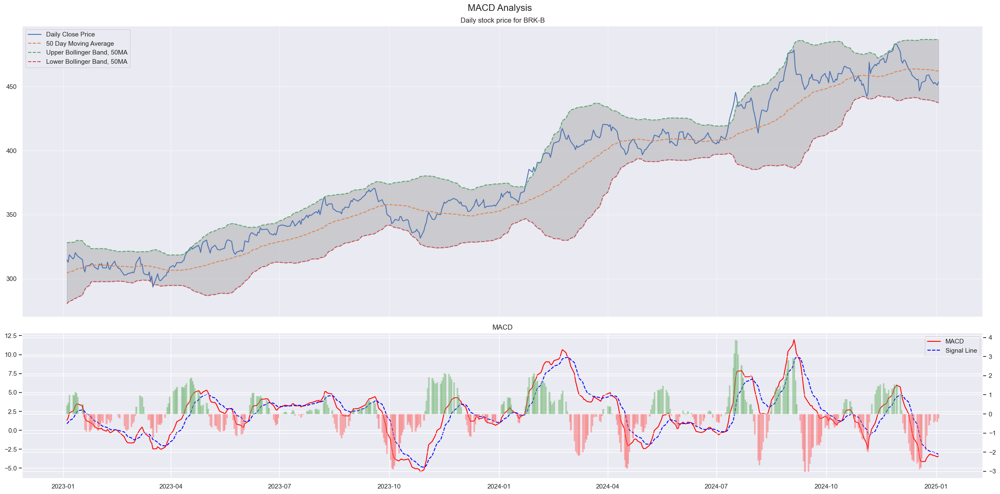

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  423.03


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  454.15


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  455.58


[*********************100%***********************]  1 of 1 completed

Current RSI: 44.2 
Current MACD Divergence: -0.1 


Tomorrow inferred RSI: 47.64 
Tomorrow inferred MACD Divergence: 0.03 


In [4]:
# recent low 437.90 on 11/4/2024
stock_name = 'brk-b'

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 916.58
* Recent high: 1008.25
* Current stock price is at 90.91% of recent high
Latest 20 Day MA: 962.33
Latest Lower Bollinger Band, 20MA: 904.04
Latest Higher Bollinger Band, 20MA: 1020.62
Latest 50 Day MA: 940.27
Latest Lower Bollinger Band, 50MA: 846.63
Latest Higher Bollinger Band, 50MA: 1033.9
Latest 50 Day EMA: 940.05
Latest 120 Day MA: 900.94
Latest 200 Day MA: 855.31
Latest 200 Day EMA: 856.19

Latest RSI: 17.98 
Latest MACD Divergence: -8.98 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 181.22
20MA break point: 964.74
20MA Lower Bollinger Band break point: 900.11
20MA Upper Bollinger Band break point: 1029.36
50MA break point: 940.75
50MA Lower Bollinger Band break point: 838.74
50MA Upper Bollinger Band break point: 1042.77
120MA break point: 900.81
200MA break point: 855.0


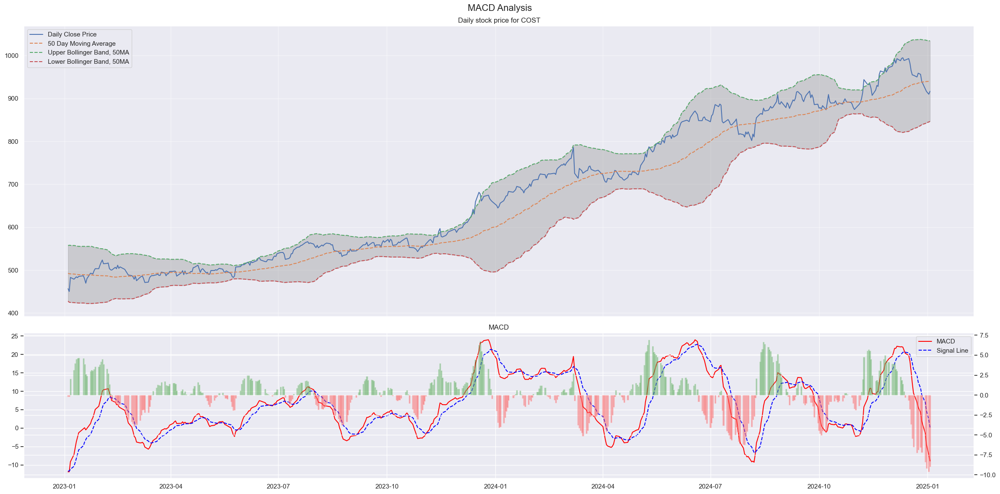

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  841.44


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  877.41


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  879.15


[*********************100%***********************]  1 of 1 completed

Current RSI: 17.27 
Current MACD Divergence: -8.11 


Tomorrow inferred RSI: 14.57 
Tomorrow inferred MACD Divergence: -7.13 


In [5]:
# Very strong supp: 793 - 783
stock_name = 'cost'

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 544.4
* Recent high: 559.96
* Current stock price is at 97.22% of recent high
Latest 20 Day MA: 549.72
Latest Lower Bollinger Band, 20MA: 534.45
Latest Higher Bollinger Band, 20MA: 565.0
Latest 50 Day MA: 545.21
Latest Lower Bollinger Band, 50MA: 520.64
Latest Higher Bollinger Band, 50MA: 569.78
Latest 50 Day EMA: 543.58
Latest 120 Day MA: 526.47
Latest 200 Day MA: 509.75
Latest 200 Day EMA: 510.55

Latest RSI: 40.17 
Latest MACD Divergence: -1.59 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 394.01
20MA break point: 550.0
20MA Lower Bollinger Band break point: 532.03
20MA Upper Bollinger Band break point: 567.98
50MA break point: 545.23
50MA Lower Bollinger Band break point: 518.35
50MA Upper Bollinger Band break point: 572.11
120MA break point: 526.32
200MA break point: 509.58


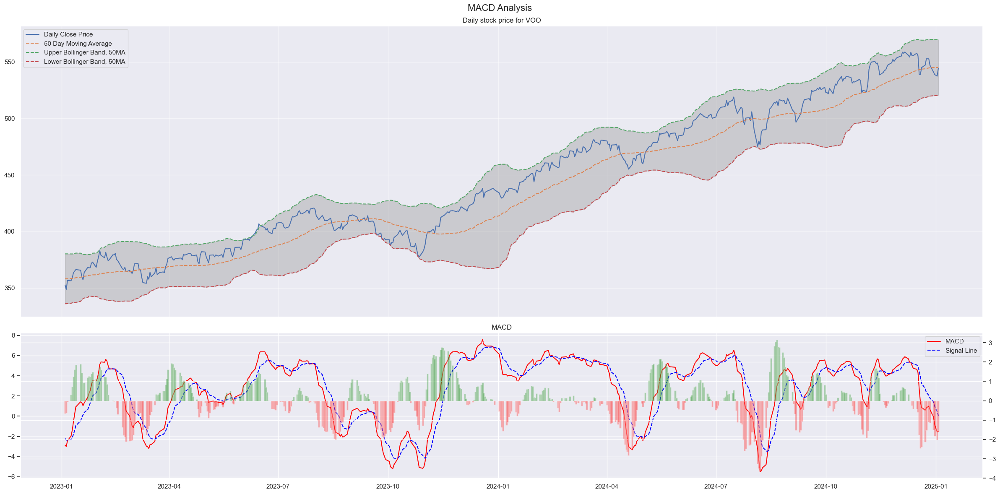

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  503.93


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  504.95


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  503.96


[*********************100%***********************]  1 of 1 completed

Current RSI: 40.2 
Current MACD Divergence: -1.24 


Tomorrow inferred RSI: 37.83 
Tomorrow inferred MACD Divergence: -0.96 


In [6]:
# Strong supp: 473 - 470.7
stock_name = 'voo'

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 235.75
* Recent high: 241.88
* Current stock price is at 97.47% of recent high
Latest 20 Day MA: 237.3
Latest Lower Bollinger Band, 20MA: 230.94
Latest Higher Bollinger Band, 20MA: 243.66
Latest 50 Day MA: 234.18
Latest Lower Bollinger Band, 50MA: 222.48
Latest Higher Bollinger Band, 50MA: 245.87
Latest 50 Day EMA: 233.85
Latest 120 Day MA: 225.68
Latest 200 Day MA: 220.69
Latest 200 Day EMA: 220.1

Latest RSI: 46.6 
Latest MACD Divergence: -0.72 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 131.58
20MA break point: 237.38
20MA Lower Bollinger Band break point: 229.85
20MA Upper Bollinger Band break point: 244.92
50MA break point: 234.14
50MA Lower Bollinger Band break point: 221.36
50MA Upper Bollinger Band break point: 246.93
120MA break point: 225.59
200MA break point: 220.62


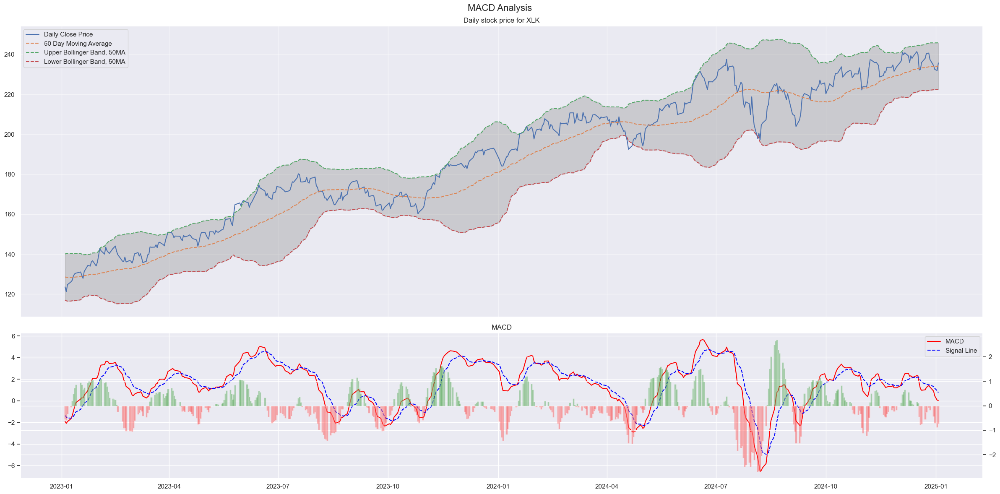

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  228.48


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  224.05


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  223.19


[*********************100%***********************]  1 of 1 completed

Current RSI: 44.93 
Current MACD Divergence: -0.58 


Tomorrow inferred RSI: 40.56 
Tomorrow inferred MACD Divergence: -0.47 


In [7]:
stock_name = 'xlk'

stock_strategy(stock_name).output()
print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 513.0
* Recent high: 630.73
* Current stock price is at 81.33% of recent high
Latest 20 Day MA: 518.1
Latest Lower Bollinger Band, 20MA: 466.24
Latest Higher Bollinger Band, 20MA: 569.96
Latest 50 Day MA: 561.19
Latest Lower Bollinger Band, 50MA: 455.64
Latest Higher Bollinger Band, 50MA: 666.74
Latest 50 Day EMA: 548.11
Latest 120 Day MA: 571.63
Latest 200 Day MA: 539.5
Latest 200 Day EMA: 547.2

Latest RSI: 48.65 
Latest MACD Divergence: 2.17 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 1949.34
20MA break point: 518.37
20MA Lower Bollinger Band break point: 456.56
20MA Upper Bollinger Band break point: 580.18
50MA break point: 562.18
50MA Lower Bollinger Band break point: 448.27
50MA Upper Bollinger Band break point: 676.08
120MA break point: 572.12
200MA break point: 539.64


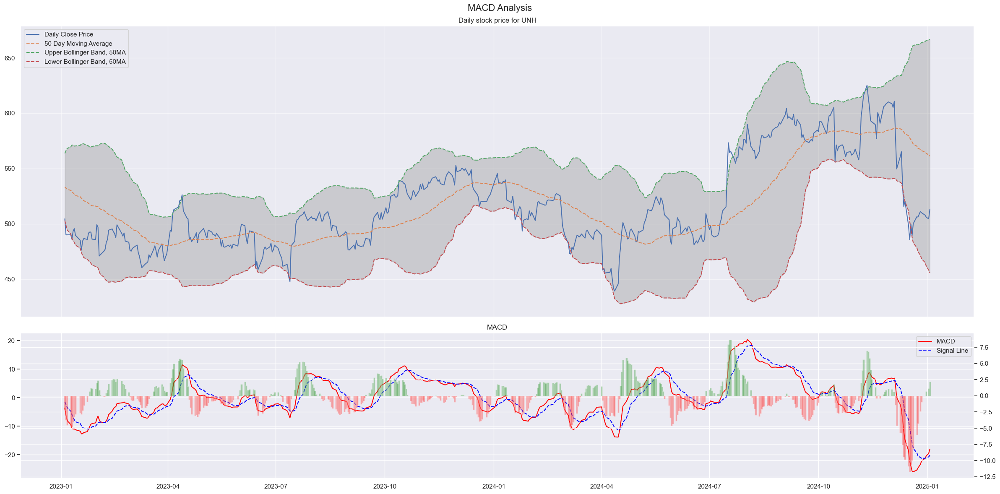

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  651.4


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  598.12


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  593.87


[*********************100%***********************]  1 of 1 completed

Current RSI: 46.15 
Current MACD Divergence: 2.86 


Tomorrow inferred RSI: 59.65 
Tomorrow inferred MACD Divergence: 3.32 


In [8]:
# 475 regression drawdown lower bound
stock_name = 'unh'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 138.96
* Recent high: 159.64
* Current stock price is at 87.05000000000001% of recent high
Latest 20 Day MA: 140.02
Latest Lower Bollinger Band, 20MA: 134.6
Latest Higher Bollinger Band, 20MA: 145.44
Latest 50 Day MA: 144.03
Latest Lower Bollinger Band, 50MA: 133.62
Latest Higher Bollinger Band, 50MA: 154.43
Latest 50 Day EMA: 143.46
Latest 120 Day MA: 149.06
Latest 200 Day MA: 147.02
Latest 200 Day EMA: 145.54

Latest RSI: 41.55 
Latest MACD Divergence: 0.13 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 272.42
50MA crosses 200MA at 338.31
20MA break point: 140.08
20MA Lower Bollinger Band break point: 133.64
20MA Upper Bollinger Band break point: 146.52
50MA break point: 144.13
50MA Lower Bollinger Band break point: 132.92
50MA Upper Bollinger Band break point: 155.34
120MA break point: 149.14
200MA break point: 147.06


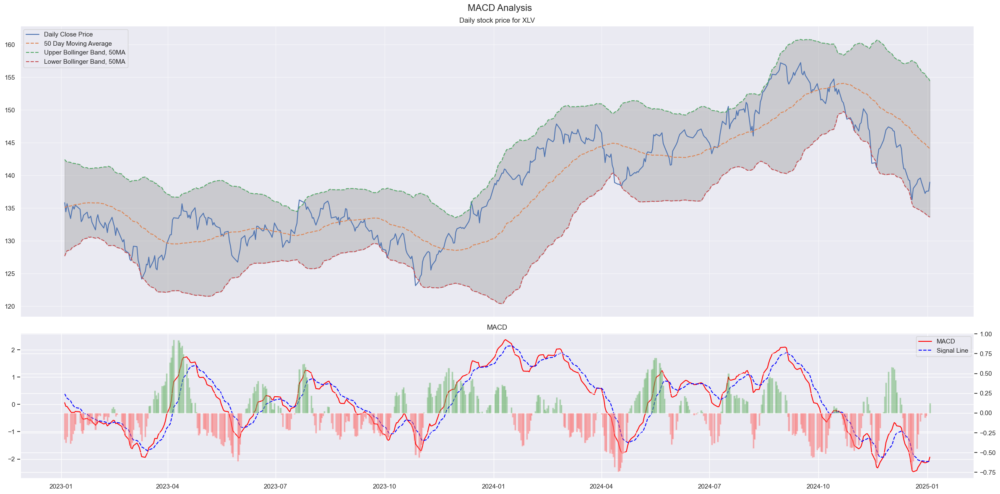

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  160.78


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  151.47


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  150.78


[*********************100%***********************]  1 of 1 completed

Current RSI: 41.62 
Current MACD Divergence: 0.22 


Tomorrow inferred RSI: 48.32 
Tomorrow inferred MACD Divergence: 0.29 


In [9]:
stock_name = 'xlv'
# return limited, buy when > 3% below the regression
# 04/17/2024 low break; 10/27/2023 low 122.59
# 133 regression drawback

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 243.36
* Recent high: 260.1
* Current stock price is at 93.56% of recent high
Latest 20 Day MA: 249.89
Latest Lower Bollinger Band, 20MA: 239.97
Latest Higher Bollinger Band, 20MA: 259.8
Latest 50 Day MA: 237.9
Latest Lower Bollinger Band, 50MA: 209.81
Latest Higher Bollinger Band, 50MA: 265.99
Latest 50 Day EMA: 240.94
Latest 120 Day MA: 229.97
Latest 200 Day MA: 214.1
Latest 200 Day EMA: 219.51

Latest RSI: 43.88 
Latest MACD Divergence: -1.67 


[*********************100%***********************]  1 of 1 completed


20MA break point: 250.23
20MA Lower Bollinger Band break point: 238.99
20MA Upper Bollinger Band break point: 261.47
50MA break point: 237.79
50MA Lower Bollinger Band break point: 207.13
50MA Upper Bollinger Band break point: 268.45
120MA break point: 229.85
200MA break point: 213.95


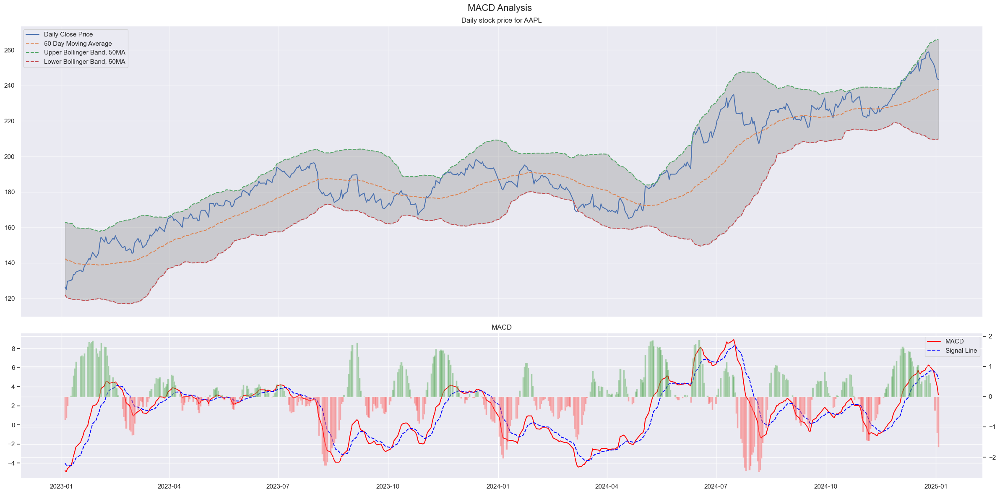

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  245.74


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  228.31


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  226.1


[*********************100%***********************]  1 of 1 completed

Current RSI: 43.62 
Current MACD Divergence: -1.92 


Tomorrow inferred RSI: 38.87 
Tomorrow inferred MACD Divergence: -2.02 


In [10]:
stock_name = 'aapl'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 90.78
* Recent high: 96.18
* Current stock price is at 94.39% of recent high
Latest 20 Day MA: 93.07
Latest Lower Bollinger Band, 20MA: 89.27
Latest Higher Bollinger Band, 20MA: 96.86
Latest 50 Day MA: 88.89
Latest Lower Bollinger Band, 50MA: 76.93
Latest Higher Bollinger Band, 50MA: 100.84
Latest 50 Day EMA: 89.03
Latest 120 Day MA: 81.19
Latest 200 Day MA: 74.14
Latest 200 Day EMA: 76.55

Latest RSI: 36.66 
Latest MACD Divergence: -0.72 


[*********************100%***********************]  1 of 1 completed


20MA break point: 93.19
20MA Lower Bollinger Band break point: 88.85
20MA Upper Bollinger Band break point: 97.53
50MA break point: 88.85
50MA Lower Bollinger Band break point: 75.79
50MA Upper Bollinger Band break point: 101.91
120MA break point: 81.1
200MA break point: 74.05


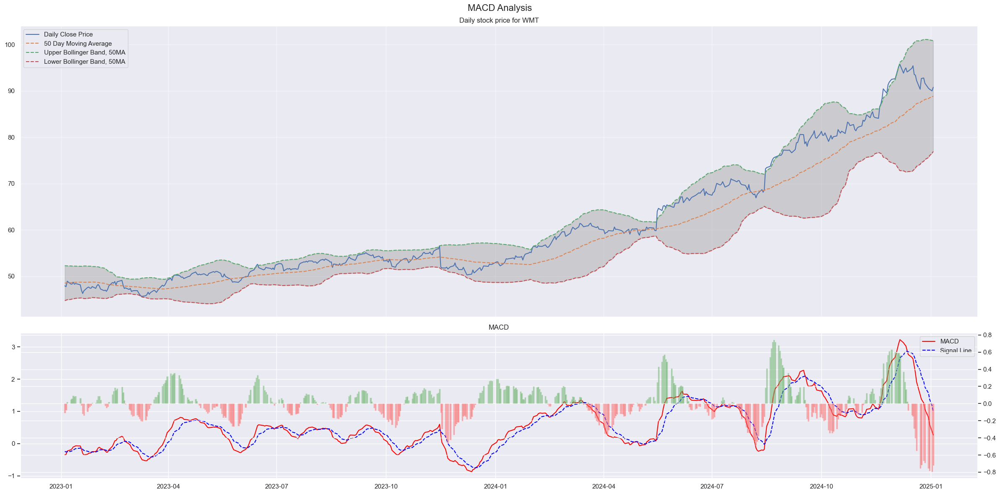

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  65.48


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  70.14


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  70.3


[*********************100%***********************]  1 of 1 completed

Current RSI: 35.84 
Current MACD Divergence: -0.65 


Tomorrow inferred RSI: 32.42 
Tomorrow inferred MACD Divergence: -0.57 


In [11]:
stock_name = 'wmt'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 1321.98
* Recent high: 1376.84
* Current stock price is at 96.02000000000001% of recent high
Latest 20 Day MA: 1254.36
Latest Lower Bollinger Band, 20MA: 1179.19
Latest Higher Bollinger Band, 20MA: 1329.54
Latest 50 Day MA: 1242.96
Latest Lower Bollinger Band, 50MA: 1121.22
Latest Higher Bollinger Band, 50MA: 1364.7
Latest 50 Day EMA: 1252.81
Latest 120 Day MA: 1252.35
Latest 200 Day MA: 1127.27
Latest 200 Day EMA: 1137.97

Latest RSI: 58.34 
Latest MACD Divergence: 7.22 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 941.86
20MA break point: 1250.81
20MA Lower Bollinger Band break point: 1169.55
20MA Upper Bollinger Band break point: 1332.06
50MA break point: 1241.35
50MA Lower Bollinger Band break point: 1111.85
50MA Upper Bollinger Band break point: 1370.84
120MA break point: 1251.76
200MA break point: 1126.3


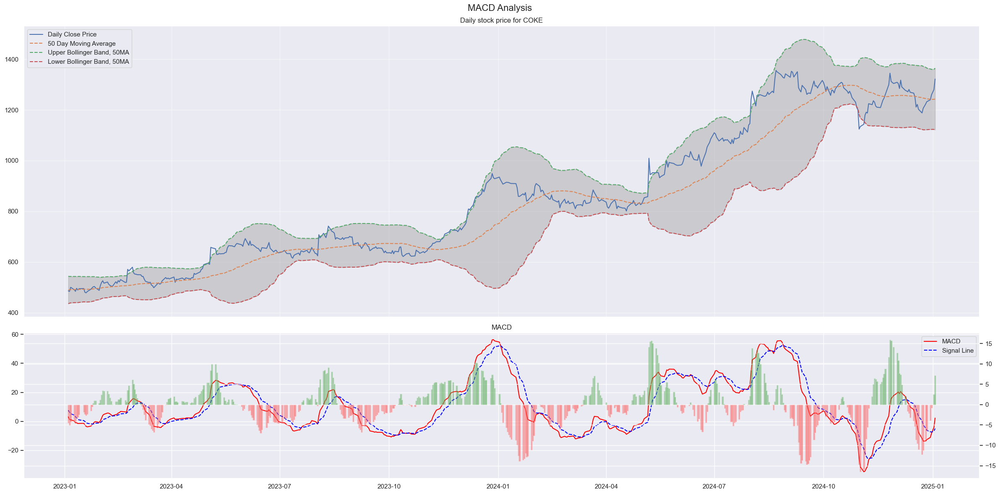

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  1126.55


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  1252.49


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  1257.41


[*********************100%***********************]  1 of 1 completed

Current RSI: 61.05 
Current MACD Divergence: 9.83 


Tomorrow inferred RSI: 61.97 
Tomorrow inferred MACD Divergence: 10.98 


In [12]:
# 1180 good supp
stock_name = 'coke'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 417.42
* Recent high: 498.23
* Current stock price is at 83.78% of recent high
Latest 20 Day MA: 435.72
Latest Lower Bollinger Band, 20MA: 410.32
Latest Higher Bollinger Band, 20MA: 461.12
Latest 50 Day MA: 445.28
Latest Lower Bollinger Band, 50MA: 395.27
Latest Higher Bollinger Band, 50MA: 495.3
Latest 50 Day EMA: 441.37
Latest 120 Day MA: 451.34
Latest 200 Day MA: 438.26
Latest 200 Day EMA: 430.08

Latest RSI: 23.18 
Latest MACD Divergence: -1.38 
20MA crosses 50MA at 736.09
20MA break point: 436.68
20MA Lower Bollinger Band break point: 408.17
20MA Upper Bollinger Band break point: 465.2
50MA break point: 445.85
50MA Lower Bollinger Band break point: 392.24
50MA Upper Bollinger Band break point: 499.45
120MA break point: 451.62
200MA break point: 438.36


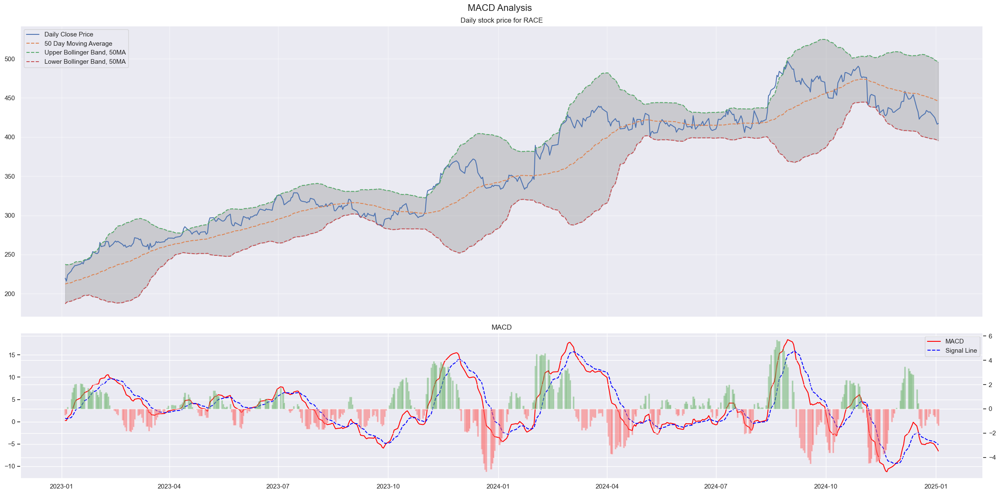

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  444.93


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  453.78


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  455.95


[*********************100%***********************]  1 of 1 completed

Current RSI: 20.3 
Current MACD Divergence: -1.37 


Tomorrow inferred RSI: 28.12 
Tomorrow inferred MACD Divergence: -1.24 


In [15]:
# 424 supp
stock_name = 'race'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

* Current stock price: 423.35
* Recent high: 468.35
* Current stock price is at 90.39% of recent high
Latest 20 Day MA: 438.5
Latest Lower Bollinger Band, 20MA: 417.76
Latest Higher Bollinger Band, 20MA: 459.23
Latest 50 Day MA: 428.46
Latest Lower Bollinger Band, 50MA: 398.31
Latest Higher Bollinger Band, 50MA: 458.62
Latest 50 Day EMA: 430.04
Latest 120 Day MA: 423.85
Latest 200 Day MA: 425.18
Latest 200 Day EMA: 417.59

Latest RSI: 27.52 
Latest MACD Divergence: -3.24 
20MA crosses 50MA at 88.91
50MA crosses 200MA at 204.69
20MA break point: 439.29
20MA Lower Bollinger Band break point: 416.06
20MA Upper Bollinger Band break point: 462.52
50MA break point: 428.57
50MA Lower Bollinger Band break point: 395.64
50MA Upper Bollinger Band break point: 461.5
120MA break point: 423.85
200MA break point: 425.19


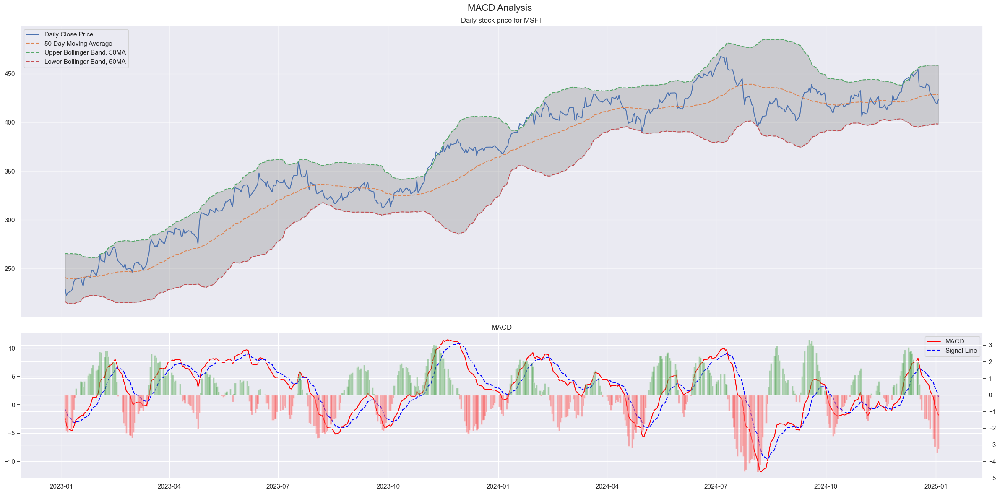

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  469.58


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  439.24


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  437.16


[*********************100%***********************]  1 of 1 completed

Current RSI: 28.64 
Current MACD Divergence: -2.93 


Tomorrow inferred RSI: 22.68 
Tomorrow inferred MACD Divergence: -2.59 


In [17]:
stock_name = 'msft'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 230.93
* Recent high: 264.8
* Current stock price is at 87.21% of recent high
Latest 20 Day MA: 238.17
Latest Lower Bollinger Band, 20MA: 231.58
Latest Higher Bollinger Band, 20MA: 244.75
Latest 50 Day MA: 227.74
Latest Lower Bollinger Band, 50MA: 201.28
Latest Higher Bollinger Band, 50MA: 254.21
Latest 50 Day EMA: 231.22
Latest 120 Day MA: 227.31
Latest 200 Day MA: 233.33
Latest 200 Day EMA: 227.85

Latest RSI: 37.26 
Latest MACD Divergence: -1.25 


[*********************100%***********************]  1 of 1 completed


50MA crosses 200MA at 603.49
20MA break point: 238.55
20MA Lower Bollinger Band break point: 231.83
20MA Upper Bollinger Band break point: 245.27
50MA break point: 227.68
50MA Lower Bollinger Band break point: 198.75
50MA Upper Bollinger Band break point: 256.6
120MA break point: 227.28
200MA break point: 233.34


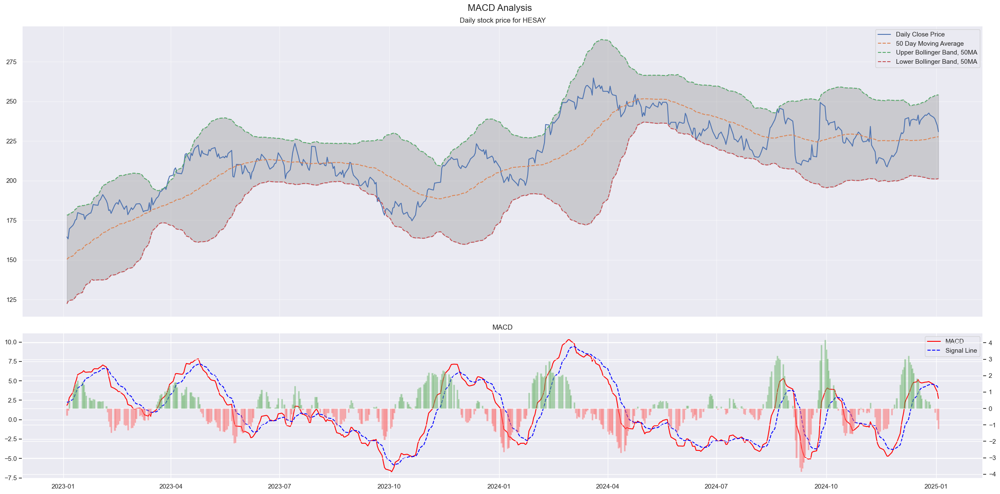

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  255.73


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  260.3


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  258.99


[*********************100%***********************]  1 of 1 completed

Current RSI: 36.49 
Current MACD Divergence: -1.56 


Tomorrow inferred RSI: 37.4 
Tomorrow inferred MACD Divergence: -1.7 


In [18]:
stock_name = 'hesay'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 303.08
* Recent high: 307.82
* Current stock price is at 98.46000000000001% of recent high
Latest 20 Day MA: 299.77
Latest Lower Bollinger Band, 20MA: 291.64
Latest Higher Bollinger Band, 20MA: 307.9
Latest 50 Day MA: 292.05
Latest Lower Bollinger Band, 50MA: 261.86
Latest Higher Bollinger Band, 50MA: 322.25
Latest 50 Day EMA: 292.02
Latest 120 Day MA: 271.26
Latest 200 Day MA: 255.52
Latest 200 Day EMA: 257.55

Latest RSI: 52.85 
Latest MACD Divergence: -0.54 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 45.66
20MA break point: 299.6
20MA Lower Bollinger Band break point: 290.08
20MA Upper Bollinger Band break point: 309.12
50MA break point: 291.83
50MA Lower Bollinger Band break point: 259.08
50MA Upper Bollinger Band break point: 324.57
120MA break point: 270.99
200MA break point: 255.28


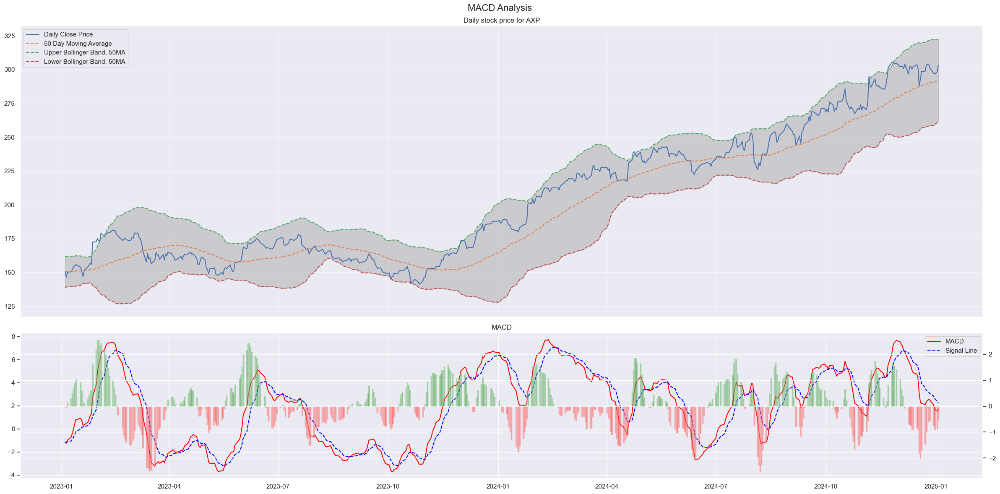

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  225.25


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  251.82


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  253.45


[*********************100%***********************]  1 of 1 completed

Current RSI: 51.0 
Current MACD Divergence: -0.31 


Tomorrow inferred RSI: 49.46 
Tomorrow inferred MACD Divergence: -0.18 


In [19]:
stock_name = 'axp'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 191.79
* Recent high: 201.42
* Current stock price is at 95.22% of recent high
Latest 20 Day MA: 189.32
Latest Lower Bollinger Band, 20MA: 174.95
Latest Higher Bollinger Band, 20MA: 203.68
Latest 50 Day MA: 178.96
Latest Lower Bollinger Band, 50MA: 152.78
Latest Higher Bollinger Band, 50MA: 205.14
Latest 50 Day EMA: 180.95
Latest 120 Day MA: 170.36
Latest 200 Day MA: 169.92
Latest 200 Day EMA: 167.34

Latest RSI: 49.75 
Latest MACD Divergence: -0.73 


[*********************100%***********************]  1 of 1 completed


20MA break point: 189.19
20MA Lower Bollinger Band break point: 172.11
20MA Upper Bollinger Band break point: 206.27
50MA break point: 178.69
50MA Lower Bollinger Band break point: 150.5
50MA Upper Bollinger Band break point: 206.89
120MA break point: 170.18
200MA break point: 169.81


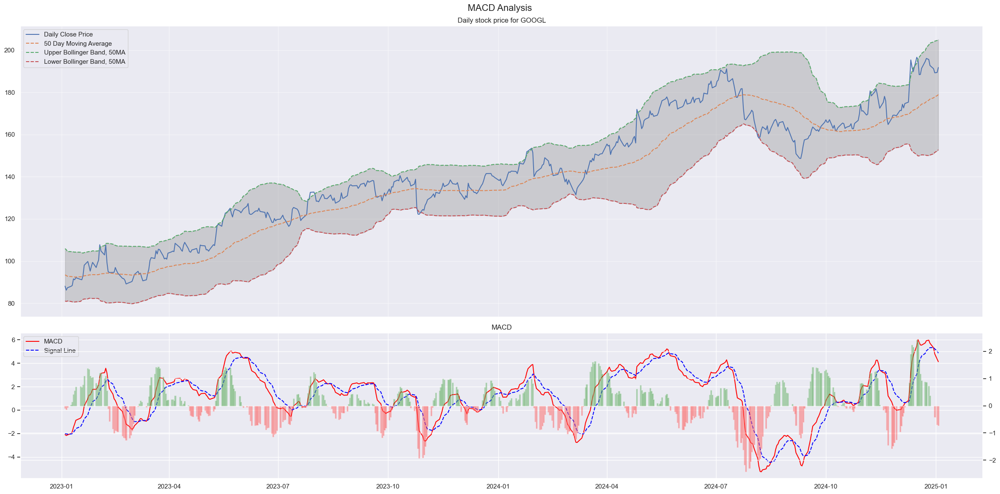

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  176.39


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  169.53


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  168.45


[*********************100%***********************]  1 of 1 completed

Current RSI: 53.07 
Current MACD Divergence: -0.76 


Tomorrow inferred RSI: 40.36 
Tomorrow inferred MACD Divergence: -0.78 


In [20]:
stock_name = 'googl'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 181.22
* Recent high: 207.32
* Current stock price is at 87.41% of recent high
Latest 20 Day MA: 176.14
Latest Lower Bollinger Band, 20MA: 170.63
Latest Higher Bollinger Band, 20MA: 181.65
Latest 50 Day MA: 180.87
Latest Lower Bollinger Band, 50MA: 153.88
Latest Higher Bollinger Band, 50MA: 207.85
Latest 50 Day EMA: 180.12
Latest 120 Day MA: 186.61
Latest 200 Day MA: 178.8
Latest 200 Day EMA: 178.34

Latest RSI: 64.96 
Latest MACD Divergence: 0.93 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 338.74
50MA crosses 200MA at 43.52
20MA break point: 175.87
20MA Lower Bollinger Band break point: 169.95
20MA Upper Bollinger Band break point: 181.8
50MA break point: 180.86
50MA Lower Bollinger Band break point: 151.34
50MA Upper Bollinger Band break point: 210.38
120MA break point: 186.66
200MA break point: 178.79


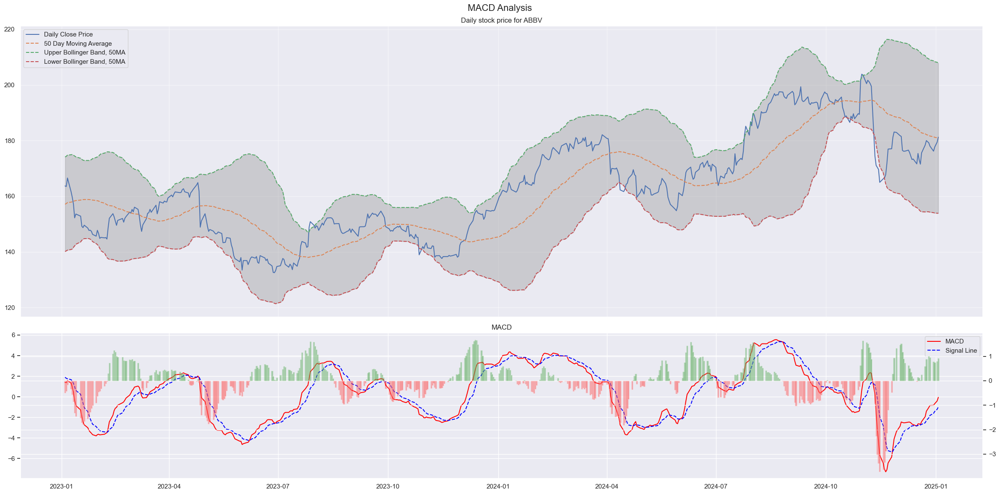

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  183.53


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  191.51


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  190.98


[*********************100%***********************]  1 of 1 completed

Current RSI: 64.73 
Current MACD Divergence: 0.97 


Tomorrow inferred RSI: 69.25 
Tomorrow inferred MACD Divergence: 0.94 


In [21]:
stock_name = 'abbv'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 781.98
* Recent high: 972.53
* Current stock price is at 80.41% of recent high
Latest 20 Day MA: 787.29
Latest Lower Bollinger Band, 20MA: 751.14
Latest Higher Bollinger Band, 20MA: 823.44
Latest 50 Day MA: 800.4
Latest Lower Bollinger Band, 50MA: 694.71
Latest Higher Bollinger Band, 50MA: 906.09
Latest 50 Day EMA: 805.89
Latest 120 Day MA: 856.95
Latest 200 Day MA: 839.52
Latest 200 Day EMA: 806.52

Latest RSI: 49.83 
Latest MACD Divergence: 1.02 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 1218.98
50MA crosses 200MA at 3390.2
20MA break point: 787.57
20MA Lower Bollinger Band break point: 744.54
20MA Upper Bollinger Band break point: 830.59
50MA break point: 800.77
50MA Lower Bollinger Band break point: 685.37
50MA Upper Bollinger Band break point: 916.18
120MA break point: 857.58
200MA break point: 839.81


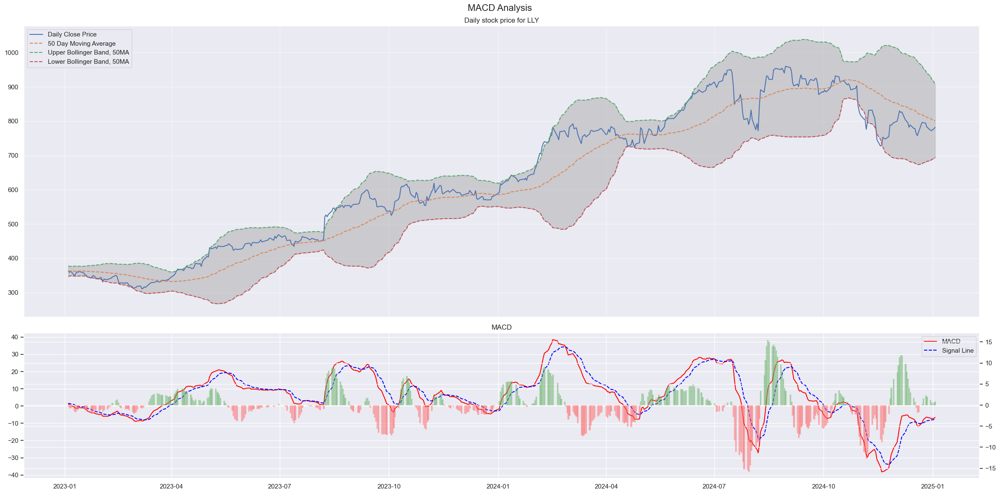

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  919.04


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  969.69


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  971.74


[*********************100%***********************]  1 of 1 completed

Current RSI: 46.59 
Current MACD Divergence: 1.23 


Tomorrow inferred RSI: 51.58 
Tomorrow inferred MACD Divergence: 1.36 


In [22]:
# 711.4 post-QE drawback, 697.33 regression drawback
# 750 supp
stock_name = 'lly'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 521.36
* Recent high: 537.7
* Current stock price is at 96.96000000000001% of recent high
Latest 20 Day MA: 528.13
Latest Lower Bollinger Band, 20MA: 518.62
Latest Higher Bollinger Band, 20MA: 537.64
Latest 50 Day MA: 522.34
Latest Lower Bollinger Band, 50MA: 499.71
Latest Higher Bollinger Band, 50MA: 544.97
Latest 50 Day EMA: 520.53
Latest 120 Day MA: 495.95
Latest 200 Day MA: 480.04
Latest 200 Day EMA: 484.83

Latest RSI: 38.84 
Latest MACD Divergence: -1.38 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 328.57
20MA break point: 528.48
20MA Lower Bollinger Band break point: 517.79
20MA Upper Bollinger Band break point: 539.17
50MA break point: 522.36
50MA Lower Bollinger Band break point: 497.61
50MA Upper Bollinger Band break point: 547.12
120MA break point: 495.74
200MA break point: 479.84


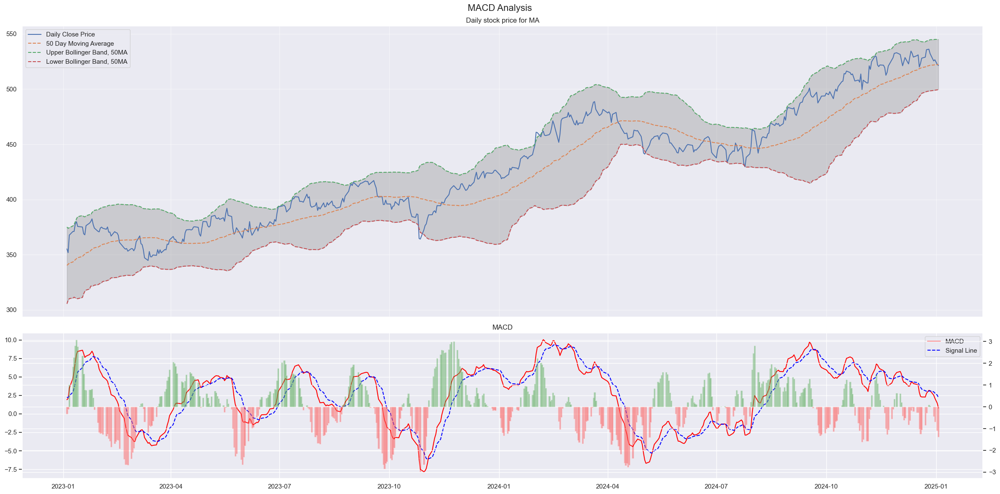

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  537.42


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  474.27


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  475.73


[*********************100%***********************]  1 of 1 completed

Current RSI: 41.71 
Current MACD Divergence: -1.51 


Tomorrow inferred RSI: 40.0 
Tomorrow inferred MACD Divergence: -1.53 


In [23]:
stock_name = 'ma'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 53.37
* Recent high: 59.49
* Current stock price is at 89.71000000000001% of recent high
Latest 20 Day MA: 54.25
Latest Lower Bollinger Band, 20MA: 51.89
Latest Higher Bollinger Band, 20MA: 56.61
Latest 50 Day MA: 54.39
Latest Lower Bollinger Band, 50MA: 52.06
Latest Higher Bollinger Band, 50MA: 56.72
Latest 50 Day EMA: 54.56
Latest 120 Day MA: 55.91
Latest 200 Day MA: 54.84
Latest 200 Day EMA: 54.05

Latest RSI: 28.88 
Latest MACD Divergence: -0.1 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 57.95
50MA crosses 200MA at 83.44
20MA break point: 54.3
20MA Lower Bollinger Band break point: 51.53
20MA Upper Bollinger Band break point: 57.07
50MA break point: 54.41
50MA Lower Bollinger Band break point: 51.89
50MA Upper Bollinger Band break point: 56.93
120MA break point: 55.93
200MA break point: 54.85


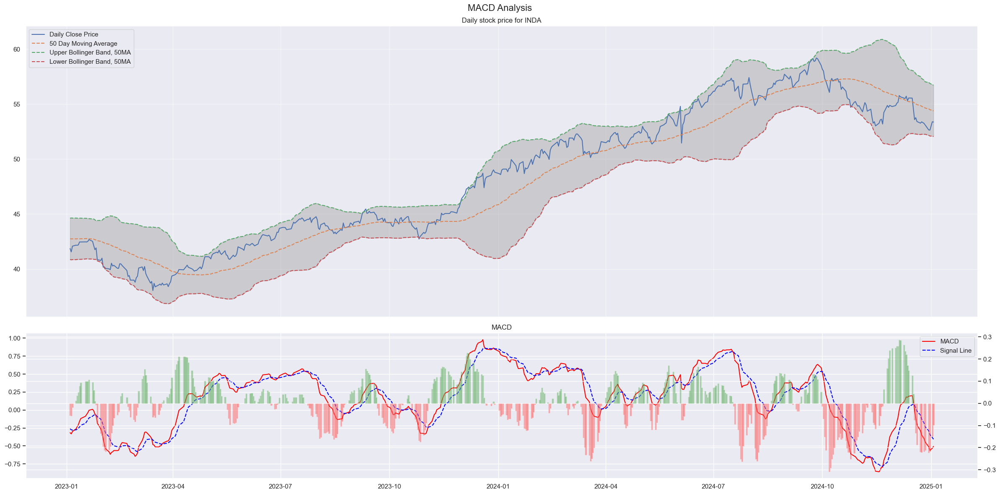

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  51.02


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  54.73


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  54.67


[*********************100%***********************]  1 of 1 completed

Current RSI: 24.59 
Current MACD Divergence: -0.06 


Tomorrow inferred RSI: 24.65 
Tomorrow inferred MACD Divergence: -0.03 


In [24]:
# 11/21/2024 low 52.89, 12/30 low 52.53 then 6/4/2024 50.84
stock_name = 'inda'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

#### Return limited; buy low only

[*********************100%***********************]  1 of 1 completed


* Current stock price: 165.13
* Recent high: 180.43
* Current stock price is at 91.52% of recent high
Latest 20 Day MA: 169.79
Latest Lower Bollinger Band, 20MA: 164.69
Latest Higher Bollinger Band, 20MA: 174.89
Latest 50 Day MA: 170.02
Latest Lower Bollinger Band, 50MA: 159.1
Latest Higher Bollinger Band, 50MA: 180.95
Latest 50 Day EMA: 170.25
Latest 120 Day MA: 170.37
Latest 200 Day MA: 167.63
Latest 200 Day EMA: 166.96

Latest RSI: 25.84 
Latest MACD Divergence: -0.56 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 172.87
50MA crosses 200MA at 5.65
20MA break point: 170.04
20MA Lower Bollinger Band break point: 164.54
20MA Upper Bollinger Band break point: 175.53
50MA break point: 170.12
50MA Lower Bollinger Band break point: 158.33
50MA Upper Bollinger Band break point: 181.92
120MA break point: 170.42
200MA break point: 167.65


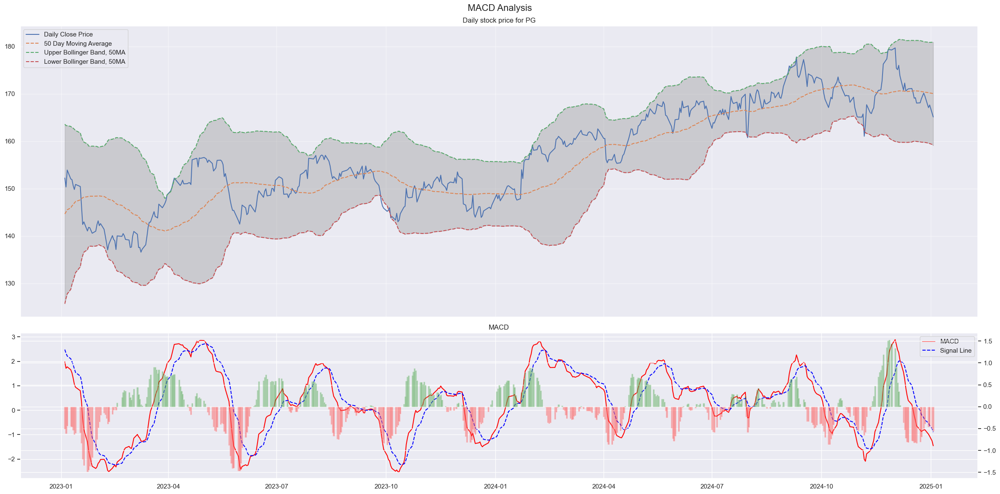

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  170.95


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  168.15


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  167.82


[*********************100%***********************]  1 of 1 completed

Current RSI: 24.51 
Current MACD Divergence: -0.56 


Tomorrow inferred RSI: 23.98 
Tomorrow inferred MACD Divergence: -0.52 


In [25]:
# only buy at least 4% below regression
stock_name = 'pg'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 78.33
* Recent high: 84.53
* Current stock price is at 92.67% of recent high
Latest 20 Day MA: 80.52
Latest Lower Bollinger Band, 20MA: 77.26
Latest Higher Bollinger Band, 20MA: 83.77
Latest 50 Day MA: 80.9
Latest Lower Bollinger Band, 50MA: 77.56
Latest Higher Bollinger Band, 50MA: 84.23
Latest 50 Day EMA: 80.74
Latest 120 Day MA: 81.01
Latest 200 Day MA: 79.14
Latest 200 Day EMA: 79.18

Latest RSI: 19.85 
Latest MACD Divergence: -0.27 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 91.02
20MA break point: 80.63
20MA Lower Bollinger Band break point: 76.94
20MA Upper Bollinger Band break point: 84.32
50MA break point: 80.95
50MA Lower Bollinger Band break point: 77.44
50MA Upper Bollinger Band break point: 84.46
120MA break point: 81.04
200MA break point: 79.14


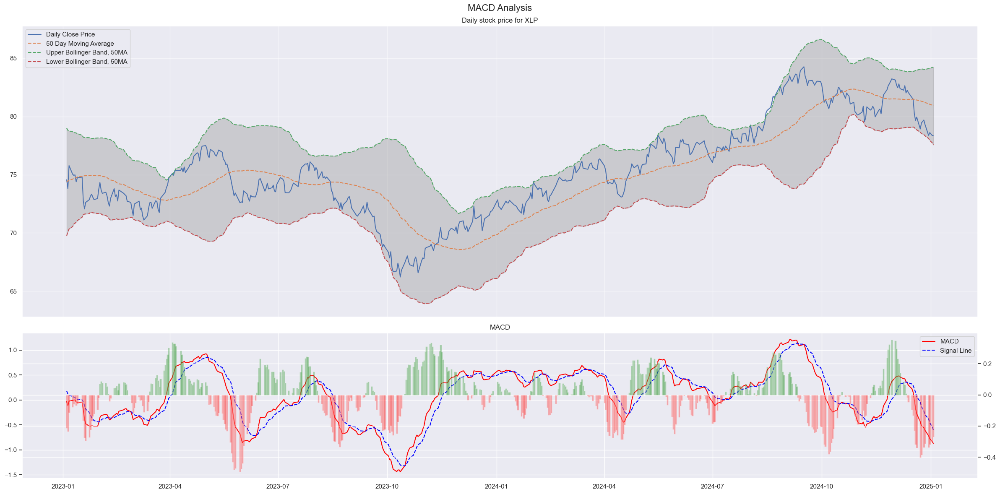

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  83.78


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  80.22


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  80.08


[*********************100%***********************]  1 of 1 completed

Current RSI: 20.51 
Current MACD Divergence: -0.23 


Tomorrow inferred RSI: 22.01 
Tomorrow inferred MACD Divergence: -0.19 


In [26]:
# return limited; at least 5% below regression

stock_name = 'xlp'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 481.82
* Recent high: 618.95
* Current stock price is at 77.84% of recent high
Latest 20 Day MA: 493.49
Latest Lower Bollinger Band, 20MA: 470.08
Latest Higher Bollinger Band, 20MA: 516.89
Latest 50 Day MA: 523.39
Latest Lower Bollinger Band, 50MA: 452.0
Latest Higher Bollinger Band, 50MA: 594.78
Latest 50 Day EMA: 517.86
Latest 120 Day MA: 546.51
Latest 200 Day MA: 512.31
Latest 200 Day EMA: 514.73

Latest RSI: 33.82 
Latest MACD Divergence: 1.24 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 1478.45
20MA break point: 494.1
20MA Lower Bollinger Band break point: 466.96
20MA Upper Bollinger Band break point: 521.24
50MA break point: 524.24
50MA Lower Bollinger Band break point: 447.87
50MA Upper Bollinger Band break point: 600.6
120MA break point: 547.06
200MA break point: 512.46


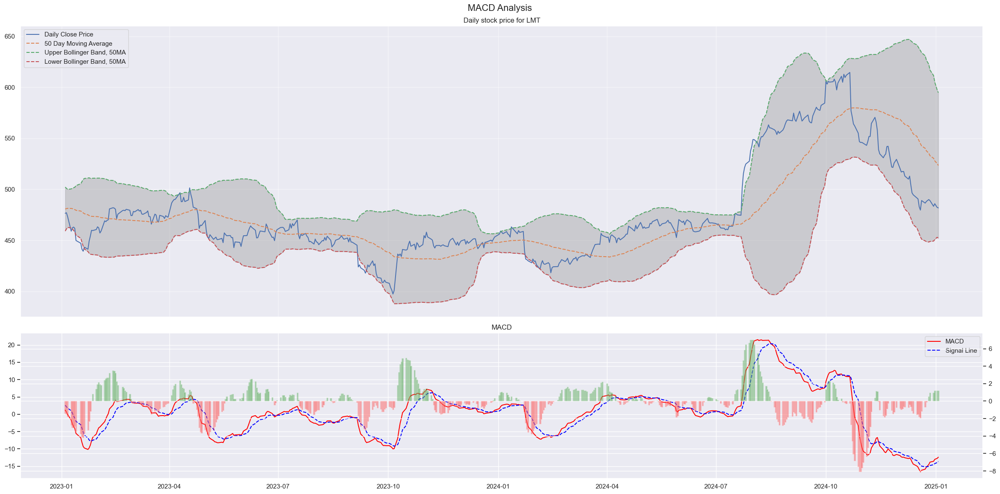

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  560.94


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  513.65


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  519.0


[*********************100%***********************]  1 of 1 completed

Current RSI: 35.31 
Current MACD Divergence: 1.31 


Tomorrow inferred RSI: 37.91 
Tomorrow inferred MACD Divergence: 1.41 


In [27]:
# 423 (425 supp) regression drawdown lower bound; 455 strong supp; 481.8 gap
stock_name = 'lmt'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## Swing

fico, nvda, tsla, ftbc not regressive

[*********************100%***********************]  1 of 1 completed


* Current stock price: 363.79
* Recent high: 418.5
* Current stock price is at 86.92999999999999% of recent high
Latest 20 Day MA: 374.36
Latest Lower Bollinger Band, 20MA: 348.35
Latest Higher Bollinger Band, 20MA: 400.37
Latest 50 Day MA: 384.91
Latest Lower Bollinger Band, 50MA: 348.79
Latest Higher Bollinger Band, 50MA: 421.03
Latest 50 Day EMA: 378.73
Latest 120 Day MA: 369.45
Latest 200 Day MA: 360.07
Latest 200 Day EMA: 356.45

Latest RSI: 29.14 
Latest MACD Divergence: -0.86 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 715.54
20MA break point: 374.91
20MA Lower Bollinger Band break point: 344.45
20MA Upper Bollinger Band break point: 405.37
50MA break point: 385.34
50MA Lower Bollinger Band break point: 346.71
50MA Upper Bollinger Band break point: 423.97
120MA break point: 369.5
200MA break point: 360.05


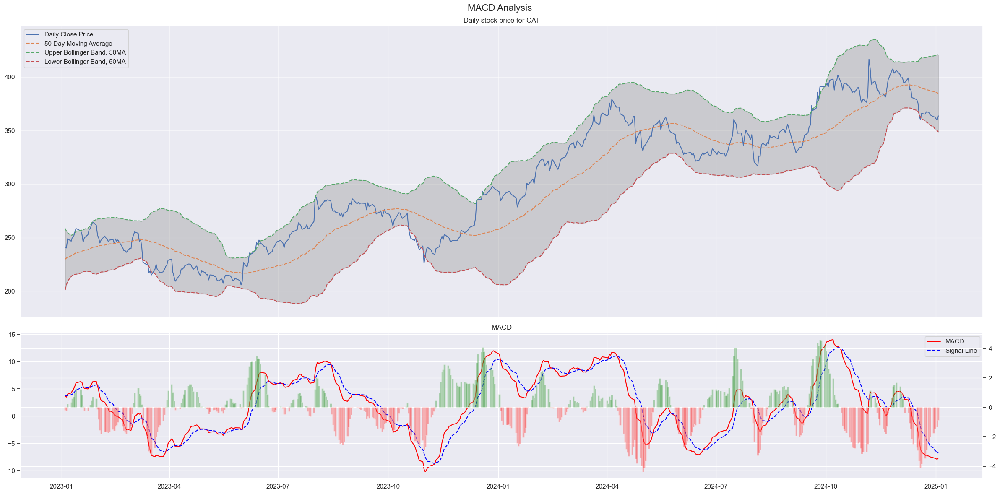

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  320.02


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  370.07


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  369.72


[*********************100%***********************]  1 of 1 completed

Current RSI: 29.34 
Current MACD Divergence: -0.46 


Tomorrow inferred RSI: 30.54 
Tomorrow inferred MACD Divergence: -0.13 


In [28]:
stock_name = 'cat'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 103.31
* Recent high: 129.89
* Current stock price is at 79.54% of recent high
Latest 20 Day MA: 109.3
Latest Lower Bollinger Band, 20MA: 96.48
Latest Higher Bollinger Band, 20MA: 122.12
Latest 50 Day MA: 115.78
Latest Lower Bollinger Band, 50MA: 98.43
Latest Higher Bollinger Band, 50MA: 133.13
Latest 50 Day EMA: 113.83
Latest 120 Day MA: 118.34
Latest 200 Day MA: 113.35
Latest 200 Day EMA: 111.95

Latest RSI: 16.9 
Latest MACD Divergence: -0.34 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 319.32
20MA break point: 109.61
20MA Lower Bollinger Band break point: 94.7
20MA Upper Bollinger Band break point: 124.53
50MA break point: 116.03
50MA Lower Bollinger Band break point: 97.7
50MA Upper Bollinger Band break point: 134.37
120MA break point: 118.46
200MA break point: 113.4


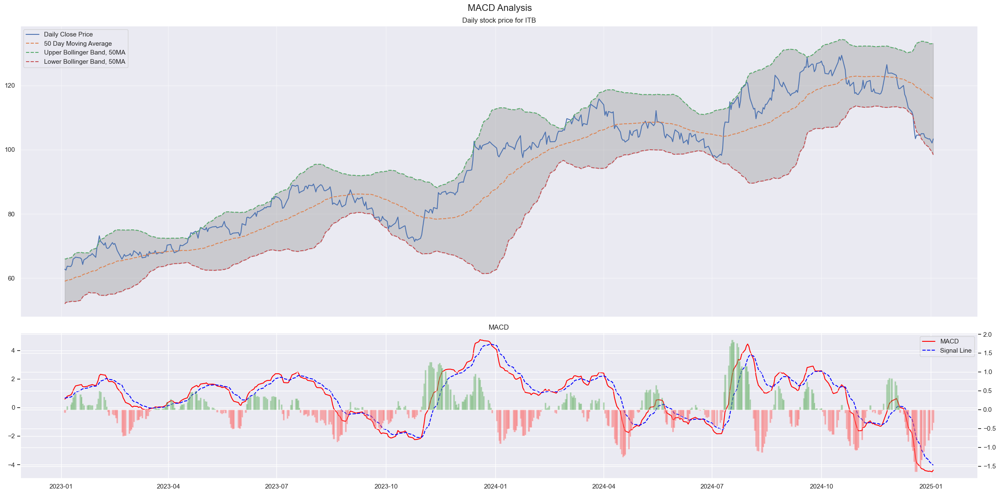

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  108.04


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  115.58


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  115.69


[*********************100%***********************]  1 of 1 completed

Current RSI: 18.78 
Current MACD Divergence: -0.16 


Tomorrow inferred RSI: 20.39 
Tomorrow inferred MACD Divergence: -0.0 


In [29]:
stock_name = 'itb'
# low on 08/05 break; low on 07/05: 96.97 - 52wk low
stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 48.59
* Recent high: 51.62
* Current stock price is at 94.13% of recent high
Latest 20 Day MA: 49.02
Latest Lower Bollinger Band, 20MA: 47.42
Latest Higher Bollinger Band, 20MA: 50.61
Latest 50 Day MA: 49.03
Latest Lower Bollinger Band, 50MA: 45.52
Latest Higher Bollinger Band, 50MA: 52.54
Latest 50 Day EMA: 48.59
Latest 120 Day MA: 46.38
Latest 200 Day MA: 44.34
Latest 200 Day EMA: 44.77

Latest RSI: 40.08 
Latest MACD Divergence: -0.1 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 49.06
20MA break point: 49.04
20MA Lower Bollinger Band break point: 47.15
20MA Upper Bollinger Band break point: 50.93
50MA break point: 49.04
50MA Lower Bollinger Band break point: 45.2
50MA Upper Bollinger Band break point: 52.87
120MA break point: 46.36
200MA break point: 44.32


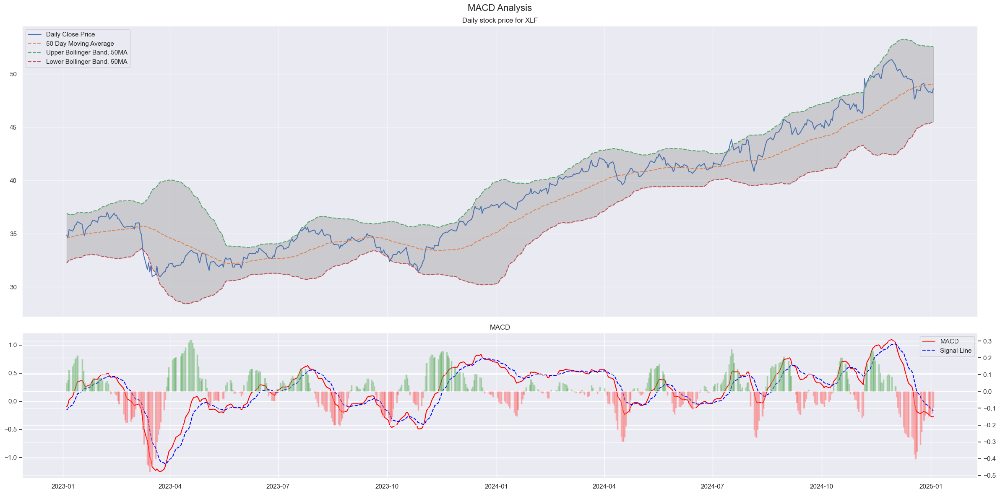

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  43.72


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  43.9


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  44.01


[*********************100%***********************]  1 of 1 completed

Current RSI: 40.4 
Current MACD Divergence: -0.07 


Tomorrow inferred RSI: 41.15 
Tomorrow inferred MACD Divergence: -0.04 


In [30]:
stock_name = 'xlf'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 389.18
* Recent high: 439.37
* Current stock price is at 88.58% of recent high
Latest 20 Day MA: 404.29
Latest Lower Bollinger Band, 20MA: 372.6
Latest Higher Bollinger Band, 20MA: 435.97
Latest 50 Day MA: 406.7
Latest Lower Bollinger Band, 50MA: 371.22
Latest Higher Bollinger Band, 50MA: 442.18
Latest 50 Day EMA: 403.27
Latest 120 Day MA: 390.29
Latest 200 Day MA: 372.3
Latest 200 Day EMA: 379.07

Latest RSI: 26.78 
Latest MACD Divergence: -1.79 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 469.66
20MA break point: 405.08
20MA Lower Bollinger Band break point: 368.24
20MA Upper Bollinger Band break point: 441.92
50MA break point: 407.06
50MA Lower Bollinger Band break point: 368.86
50MA Upper Bollinger Band break point: 445.25
120MA break point: 390.3
200MA break point: 372.22


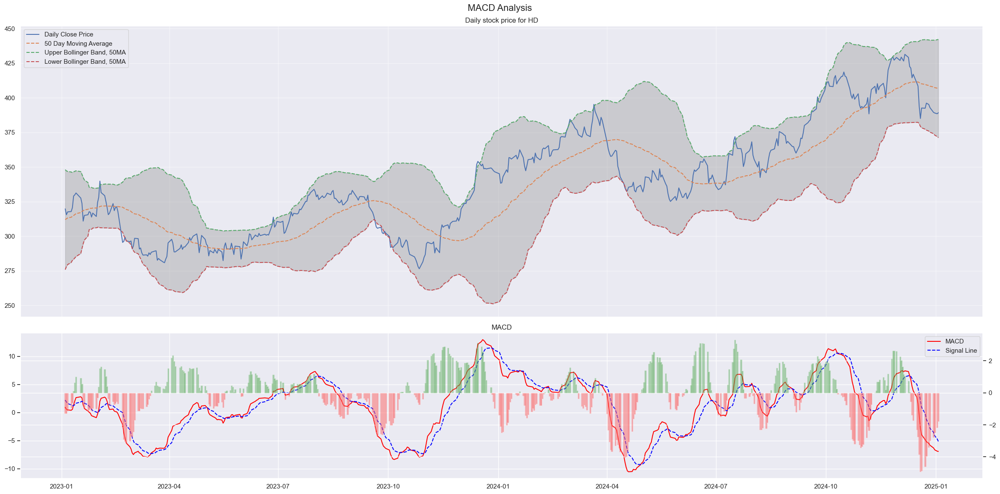

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  423.18


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  374.82


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  371.59


[*********************100%***********************]  1 of 1 completed

Current RSI: 23.16 
Current MACD Divergence: -1.4 


Tomorrow inferred RSI: 26.35 
Tomorrow inferred MACD Divergence: -1.03 


In [31]:
# 370 strong supp
stock_name = 'hd'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 243.28
* Recent high: 254.31
* Current stock price is at 95.66% of recent high
Latest 20 Day MA: 240.54
Latest Lower Bollinger Band, 20MA: 232.62
Latest Higher Bollinger Band, 20MA: 248.45
Latest 50 Day MA: 238.49
Latest Lower Bollinger Band, 50MA: 216.4
Latest Higher Bollinger Band, 50MA: 260.57
Latest 50 Day EMA: 236.67
Latest 120 Day MA: 223.33
Latest 200 Day MA: 212.85
Latest 200 Day EMA: 213.67

Latest RSI: 52.76 
Latest MACD Divergence: -0.01 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 175.05
20MA break point: 240.39
20MA Lower Bollinger Band break point: 231.08
20MA Upper Bollinger Band break point: 249.7
50MA break point: 238.39
50MA Lower Bollinger Band break point: 214.3
50MA Upper Bollinger Band break point: 262.48
120MA break point: 223.16
200MA break point: 212.69


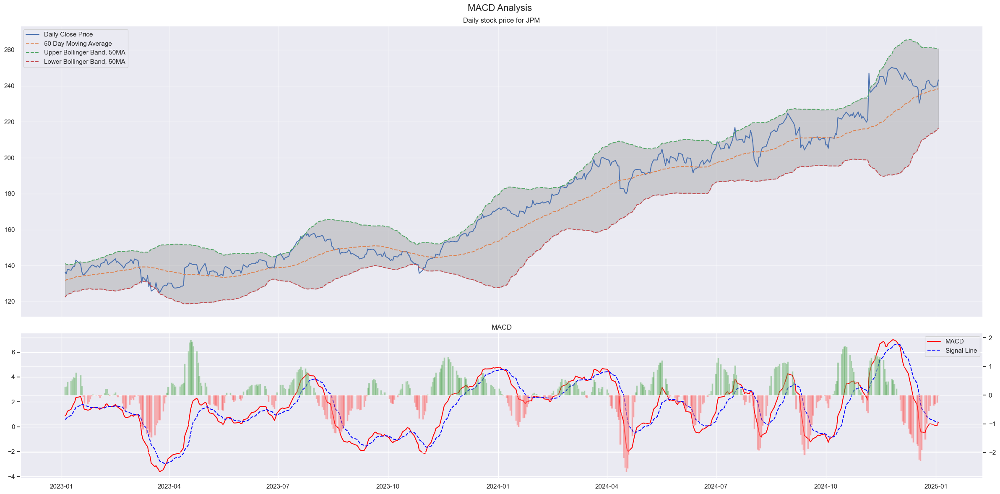

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  198.84


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  203.1


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  205.23


[*********************100%***********************]  1 of 1 completed

Current RSI: 55.54 
Current MACD Divergence: 0.15 


Tomorrow inferred RSI: 56.22 
Tomorrow inferred MACD Divergence: 0.24 


In [32]:
stock_name = 'jpm'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 251.88
* Recent high: 283.07
* Current stock price is at 88.98% of recent high
Latest 20 Day MA: 246.58
Latest Lower Bollinger Band, 20MA: 238.25
Latest Higher Bollinger Band, 20MA: 254.91
Latest 50 Day MA: 247.42
Latest Lower Bollinger Band, 50MA: 234.48
Latest Higher Bollinger Band, 50MA: 260.37
Latest 50 Day EMA: 246.58
Latest 120 Day MA: 243.53
Latest 200 Day MA: 241.44
Latest 200 Day EMA: 234.21

Latest RSI: 57.64 
Latest MACD Divergence: 0.23 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 279.9
20MA break point: 246.3
20MA Lower Bollinger Band break point: 236.82
20MA Upper Bollinger Band break point: 255.79
50MA break point: 247.33
50MA Lower Bollinger Band break point: 233.28
50MA Upper Bollinger Band break point: 261.39
120MA break point: 243.46
200MA break point: 241.39


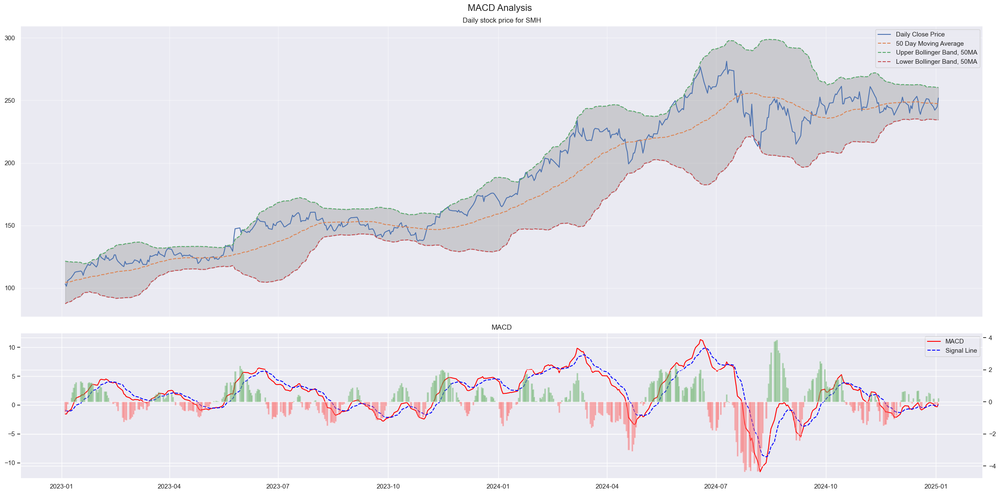

[*********************100%***********************]  1 of 1 completed


Regression price since 2010:  238.37


[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  242.56


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  242.21


[*********************100%***********************]  1 of 1 completed

Current RSI: 52.41 
Current MACD Divergence: 0.49 


Tomorrow inferred RSI: 48.5 
Tomorrow inferred MACD Divergence: 0.63 


In [33]:
# 237 STRONG supp
stock_name = 'smh'

stock_strategy(stock_name).output()

print('Regression price since 2010: ', stock_regression(stock_name))
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 1966.26
* Recent high: 2402.52
* Current stock price is at 81.84% of recent high
Latest 20 Day MA: 2122.13
Latest Lower Bollinger Band, 20MA: 1895.07
Latest Higher Bollinger Band, 20MA: 2349.18
Latest 50 Day MA: 2175.16
Latest Lower Bollinger Band, 50MA: 1800.33
Latest Higher Bollinger Band, 50MA: 2549.98
Latest 50 Day EMA: 2118.06
Latest 120 Day MA: 1955.66
Latest 200 Day MA: 1702.25
Latest 200 Day EMA: 1777.09

Latest RSI: 20.37 
Latest MACD Divergence: -18.08 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 3733.94
20MA break point: 2130.33
20MA Lower Bollinger Band break point: 1873.96
20MA Upper Bollinger Band break point: 2386.7
50MA break point: 2179.42
50MA Lower Bollinger Band break point: 1777.7
50MA Upper Bollinger Band break point: 2581.14
120MA break point: 1955.57
200MA break point: 1700.92


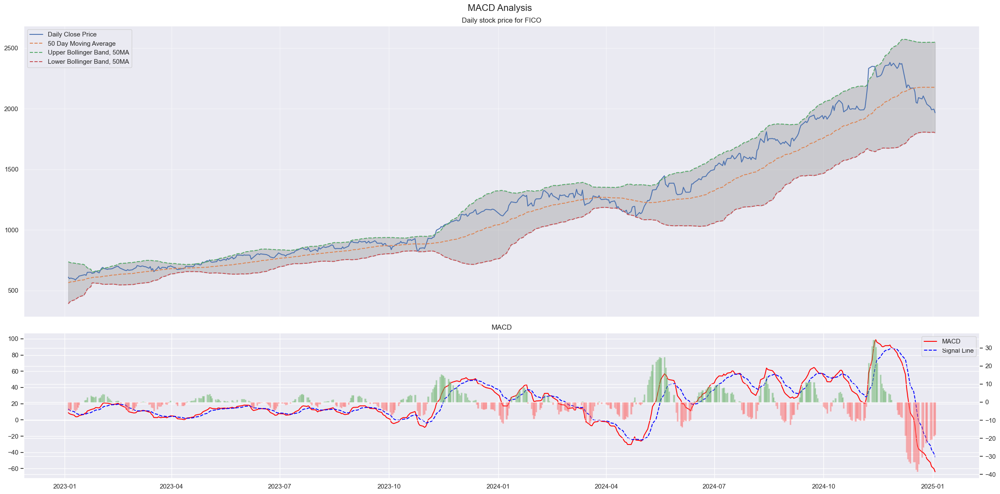

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 21.63 
Current MACD Divergence: -16.29 


Tomorrow inferred RSI: 21.28 
Tomorrow inferred MACD Divergence: -13.86 


In [34]:
stock_name = 'fico'
stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 144.47
* Recent high: 152.89
* Current stock price is at 94.49% of recent high
Latest 20 Day MA: 137.02
Latest Lower Bollinger Band, 20MA: 128.01
Latest Higher Bollinger Band, 20MA: 146.02
Latest 50 Day MA: 139.8
Latest Lower Bollinger Band, 50MA: 127.33
Latest Higher Bollinger Band, 50MA: 152.27
Latest 50 Day EMA: 136.84
Latest 120 Day MA: 128.19
Latest 200 Day MA: 118.39
Latest 200 Day EMA: 116.97

Latest RSI: 59.68 
Latest MACD Divergence: 0.77 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 237.22
20MA break point: 136.63
20MA Lower Bollinger Band break point: 126.73
20MA Upper Bollinger Band break point: 146.52
50MA break point: 139.7
50MA Lower Bollinger Band break point: 126.18
50MA Upper Bollinger Band break point: 153.23
120MA break point: 128.06
200MA break point: 118.26


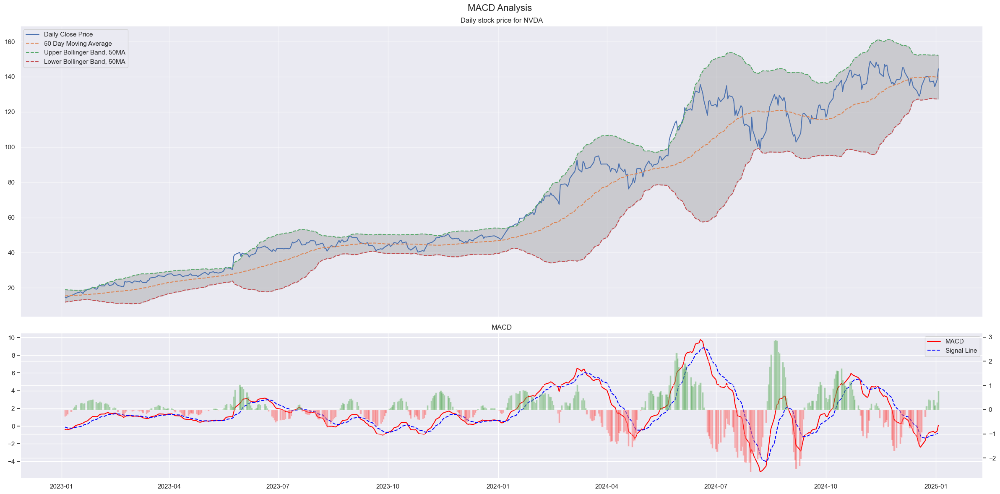

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 65.15 
Current MACD Divergence: 1.03 


Tomorrow inferred RSI: 69.81 
Tomorrow inferred MACD Divergence: 1.14 


In [35]:
stock_name = 'nvda'
stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 410.44
* Recent high: 488.54
* Current stock price is at 84.00999999999999% of recent high
Latest 20 Day MA: 422.92
Latest Lower Bollinger Band, 20MA: 364.5
Latest Higher Bollinger Band, 20MA: 481.34
Latest 50 Day MA: 353.24
Latest Lower Bollinger Band, 50MA: 180.97
Latest Higher Bollinger Band, 50MA: 525.51
Latest 50 Day EMA: 364.45
Latest 120 Day MA: 279.31
Latest 200 Day MA: 241.06
Latest 200 Day EMA: 272.69

Latest RSI: 48.61 
Latest MACD Divergence: -9.63 


[*********************100%***********************]  1 of 1 completed


20MA break point: 423.58
20MA Lower Bollinger Band break point: 354.23
20MA Upper Bollinger Band break point: 492.93
50MA break point: 352.07
50MA Lower Bollinger Band break point: 164.95
50MA Upper Bollinger Band break point: 539.19
120MA break point: 278.21
200MA break point: 240.21


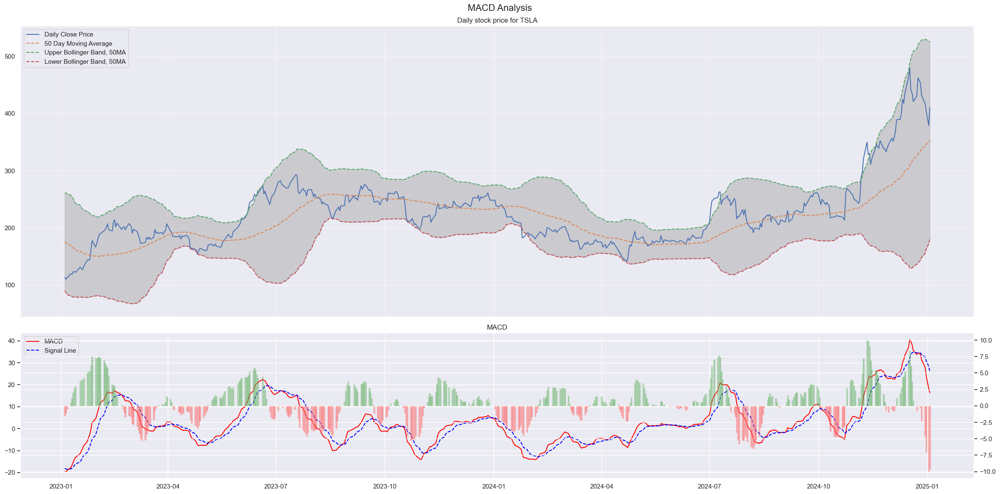

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 45.0 
Current MACD Divergence: -9.11 


Tomorrow inferred RSI: 38.62 
Tomorrow inferred MACD Divergence: -8.53 


In [36]:
# strong suppp: 190

stock_name = 'tsla'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 86.01
* Recent high: 94.81
* Current stock price is at 90.72% of recent high
Latest 20 Day MA: 85.97
Latest Lower Bollinger Band, 20MA: 79.24
Latest Higher Bollinger Band, 20MA: 92.7
Latest 50 Day MA: 78.32
Latest Lower Bollinger Band, 50MA: 52.08
Latest Higher Bollinger Band, 50MA: 104.56
Latest 50 Day EMA: 78.59
Latest 120 Day MA: 64.23
Latest 200 Day MA: 61.27
Latest 200 Day EMA: 63.08

Latest RSI: 47.82 
Latest MACD Divergence: -0.87 


[*********************100%***********************]  1 of 1 completed


20MA break point: 85.97
20MA Lower Bollinger Band break point: 77.94
20MA Upper Bollinger Band break point: 93.99
50MA break point: 78.16
50MA Lower Bollinger Band break point: 49.61
50MA Upper Bollinger Band break point: 106.71
120MA break point: 64.05
200MA break point: 61.14


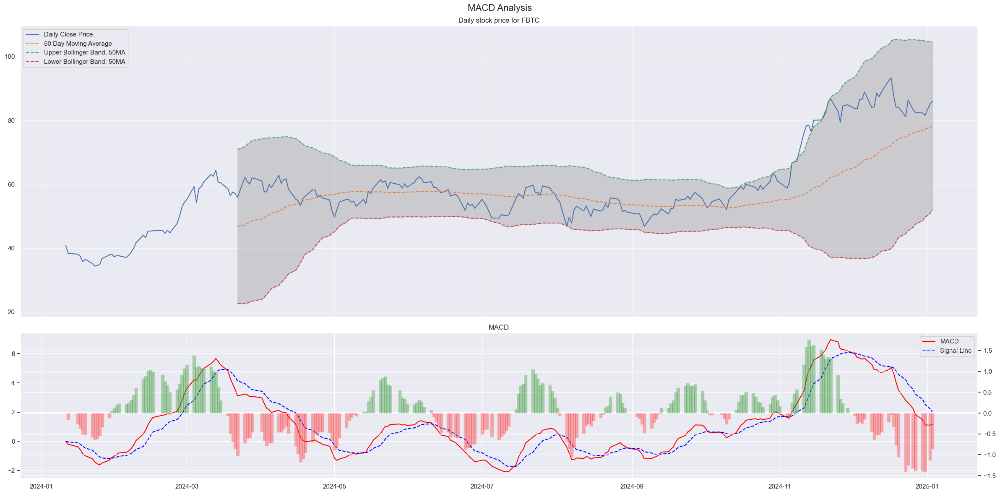

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 45.31 
Current MACD Divergence: -0.67 


Tomorrow inferred RSI: 38.36 
Tomorrow inferred MACD Divergence: -0.53 


In [37]:
# strong supp at 47

stock_name = 'fbtc'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## REF

[*********************100%***********************]  1 of 1 completed


* Current stock price: 243.49
* Recent high: 257.71
* Current stock price is at 94.48% of recent high
Latest 20 Day MA: 243.53
Latest Lower Bollinger Band, 20MA: 237.6
Latest Higher Bollinger Band, 20MA: 249.46
Latest 50 Day MA: 245.51
Latest Lower Bollinger Band, 50MA: 232.71
Latest Higher Bollinger Band, 50MA: 258.31
Latest 50 Day EMA: 243.49
Latest 120 Day MA: 238.97
Latest 200 Day MA: 229.57
Latest 200 Day EMA: 229.39

Latest RSI: 42.25 
Latest MACD Divergence: 0.19 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 309.45
20MA break point: 243.53
20MA Lower Bollinger Band break point: 236.46
20MA Upper Bollinger Band break point: 250.61
50MA break point: 245.55
50MA Lower Bollinger Band break point: 231.57
50MA Upper Bollinger Band break point: 259.53
120MA break point: 238.93
200MA break point: 229.5


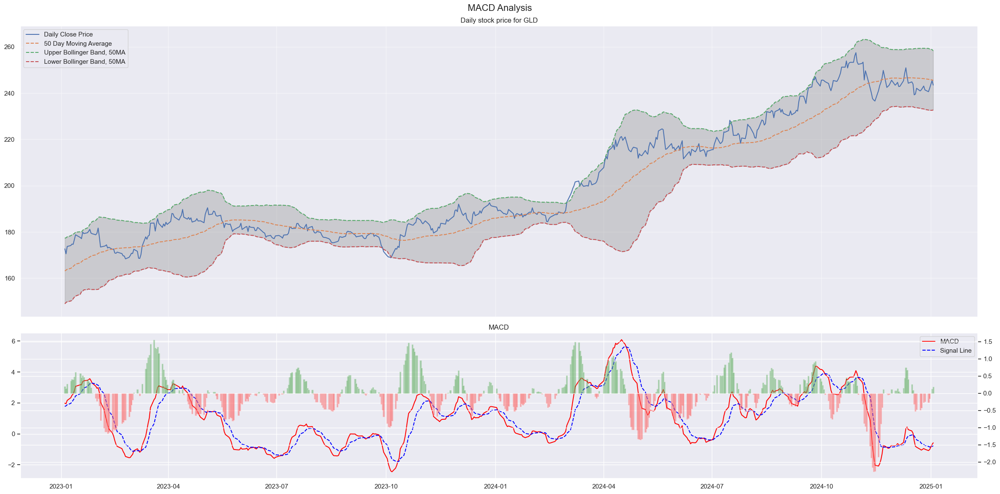

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 48.14 
Current MACD Divergence: 0.23 


Tomorrow inferred RSI: 46.67 
Tomorrow inferred MACD Divergence: 0.24 


In [38]:
# strong resistance: 229 - 230
# strong supp: 217 - 218
stock_name = 'gld'

stock_strategy(stock_name).output()

stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 87.47
* Recent high: 98.97
* Current stock price is at 88.38000000000001% of recent high
Latest 20 Day MA: 87.07
Latest Lower Bollinger Band, 20MA: 81.23
Latest Higher Bollinger Band, 20MA: 92.91
Latest 50 Day MA: 90.59
Latest Lower Bollinger Band, 50MA: 80.27
Latest Higher Bollinger Band, 50MA: 100.9
Latest 50 Day EMA: 89.28
Latest 120 Day MA: 90.07
Latest 200 Day MA: 91.16
Latest 200 Day EMA: 89.73

Latest RSI: 40.09 
Latest MACD Divergence: 0.27 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 204.7
50MA crosses 200MA at 125.28
20MA break point: 87.05
20MA Lower Bollinger Band break point: 80.08
20MA Upper Bollinger Band break point: 94.02
50MA break point: 90.65
50MA Lower Bollinger Band break point: 79.43
50MA Upper Bollinger Band break point: 101.87
120MA break point: 90.09
200MA break point: 91.17


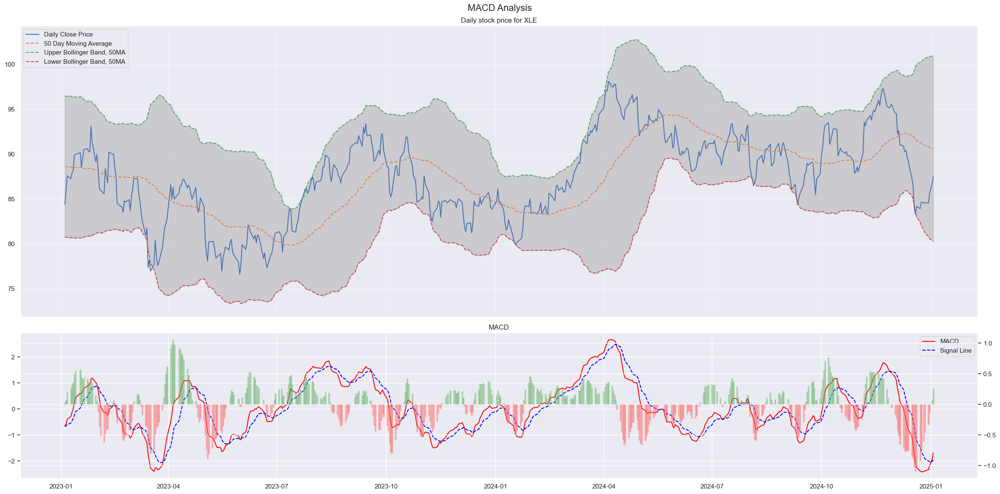

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 41.78 
Current MACD Divergence: 0.39 


Tomorrow inferred RSI: 51.21 
Tomorrow inferred MACD Divergence: 0.47 


In [39]:
# strong resistance: 90.9
# strong support: 86.4
stock_name = 'xle'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

## Gamble & Bought, so let's find the right place to sell

In [40]:
# stock_strategy('pdd').output()
# stock_strategy('pdd').latest_metric()
# stock_strategy('pdd').infer_metric()

In [41]:
# stock_strategy('anf').output()
# stock_strategy('anf').latest_metric()
# stock_strategy('anf').infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 58.07
* Recent high: 60.6
* Current stock price is at 95.83% of recent high
Latest 20 Day MA: 58.14
Latest Lower Bollinger Band, 20MA: 55.67
Latest Higher Bollinger Band, 20MA: 60.61
Latest 50 Day MA: 55.0
Latest Lower Bollinger Band, 50MA: 47.63
Latest Higher Bollinger Band, 50MA: 62.37
Latest 50 Day EMA: 55.45
Latest 120 Day MA: 51.14
Latest 200 Day MA: 48.91
Latest 200 Day EMA: 49.15

Latest RSI: 50.6 
Latest MACD Divergence: -0.33 


[*********************100%***********************]  1 of 1 completed


20MA break point: 58.14
20MA Lower Bollinger Band break point: 55.19
20MA Upper Bollinger Band break point: 61.1
50MA break point: 54.94
50MA Lower Bollinger Band break point: 46.97
50MA Upper Bollinger Band break point: 62.91
120MA break point: 51.09
200MA break point: 48.87


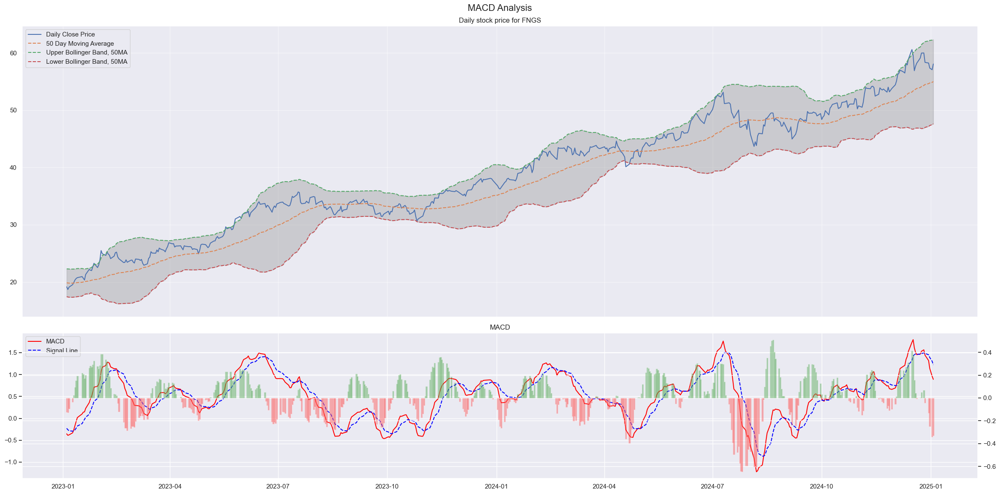

[*********************100%***********************]  1 of 1 completed


Regression price since 2020:  48.18


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


Regression price since QE:  47.88


[*********************100%***********************]  1 of 1 completed

Current RSI: 46.53 
Current MACD Divergence: -0.32 


Tomorrow inferred RSI: 38.21 
Tomorrow inferred MACD Divergence: -0.3 


In [42]:
# Very strong supp: (41.6 never reached) - 41.9 - 42.3
stock_name = 'fngs'

stock_strategy(stock_name).output()
print('Regression price since 2020: ', stock_regression(stock_name, regression_start='2020-01-01'))
print('Regression price since QE: ', stock_regression(stock_name, regression_start='2020-03-20'))
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 111.16
* Recent high: 123.74
* Current stock price is at 89.83% of recent high
Latest 20 Day MA: 112.87
Latest Lower Bollinger Band, 20MA: 109.16
Latest Higher Bollinger Band, 20MA: 116.59
Latest 50 Day MA: 108.59
Latest Lower Bollinger Band, 50MA: 88.52
Latest Higher Bollinger Band, 50MA: 128.66
Latest 50 Day EMA: 108.76
Latest 120 Day MA: 98.82
Latest 200 Day MA: 102.24
Latest 200 Day EMA: 101.75

Latest RSI: 33.03 
Latest MACD Divergence: -0.63 


[*********************100%***********************]  1 of 1 completed


20MA break point: 112.96
20MA Lower Bollinger Band break point: 108.64
20MA Upper Bollinger Band break point: 117.29
50MA break point: 108.53
50MA Lower Bollinger Band break point: 86.6
50MA Upper Bollinger Band break point: 130.47
120MA break point: 98.72
200MA break point: 102.19


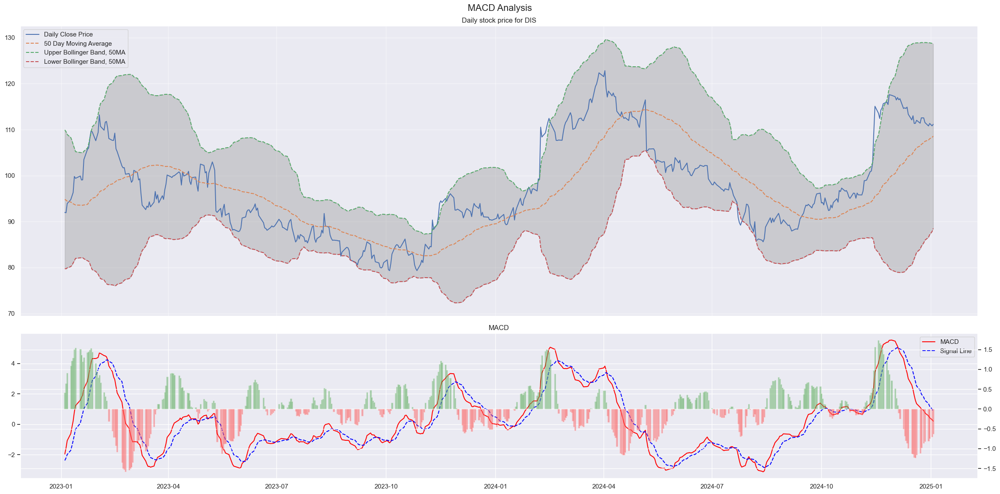

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 38.48 
Current MACD Divergence: -0.56 


Tomorrow inferred RSI: 44.23 
Tomorrow inferred MACD Divergence: -0.5 


In [43]:
stock_name = 'dis'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 33.14
* Recent high: 39.8
* Current stock price is at 83.27% of recent high
Latest 20 Day MA: 33.9
Latest Lower Bollinger Band, 20MA: 31.3
Latest Higher Bollinger Band, 20MA: 36.51
Latest 50 Day MA: 35.67
Latest Lower Bollinger Band, 50MA: 31.1
Latest Higher Bollinger Band, 50MA: 40.25
Latest 50 Day EMA: 34.95
Latest 120 Day MA: 35.55
Latest 200 Day MA: 34.15
Latest 200 Day EMA: 34.19

Latest RSI: 32.1 
Latest MACD Divergence: -0.01 


[*********************100%***********************]  1 of 1 completed


20MA crosses 50MA at 92.22
20MA break point: 33.94
20MA Lower Bollinger Band break point: 30.86
20MA Upper Bollinger Band break point: 37.02
50MA break point: 35.72
50MA Lower Bollinger Band break point: 30.82
50MA Upper Bollinger Band break point: 40.63
120MA break point: 35.57
200MA break point: 34.16


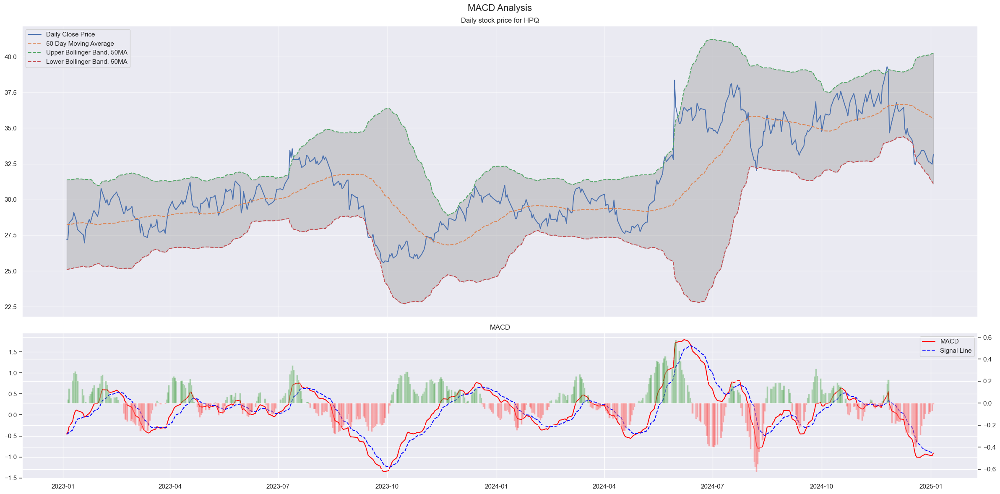

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 35.03 
Current MACD Divergence: 0.04 


Tomorrow inferred RSI: 37.93 
Tomorrow inferred MACD Divergence: 0.07 


In [44]:
stock_name = 'hpq'

stock_strategy(stock_name).output()
stock_strategy(stock_name).latest_metric()
stock_strategy(stock_name).infer_metric()

[*********************100%***********************]  1 of 1 completed


* Current stock price: 180.43
* Recent high: 198.3
* Current stock price is at 90.99000000000001% of recent high
Latest 20 Day MA: 181.63
Latest Lower Bollinger Band, 20MA: 174.28
Latest Higher Bollinger Band, 20MA: 188.98
Latest 50 Day MA: 179.66
Latest Lower Bollinger Band, 50MA: 154.55
Latest Higher Bollinger Band, 50MA: 204.78
Latest 50 Day EMA: 176.83
Latest 120 Day MA: 159.72
Latest 200 Day MA: 151.95
Latest 200 Day EMA: 154.87

Latest RSI: 41.79 
Latest MACD Divergence: -0.6 


[*********************100%***********************]  1 of 1 completed

20MA crosses 50MA at 114.87
20MA break point: 181.69
20MA Lower Bollinger Band break point: 172.95
20MA Upper Bollinger Band break point: 190.44
50MA break point: 179.65
50MA Lower Bollinger Band break point: 152.17
50MA Upper Bollinger Band break point: 207.13
120MA break point: 159.54
200MA break point: 151.81


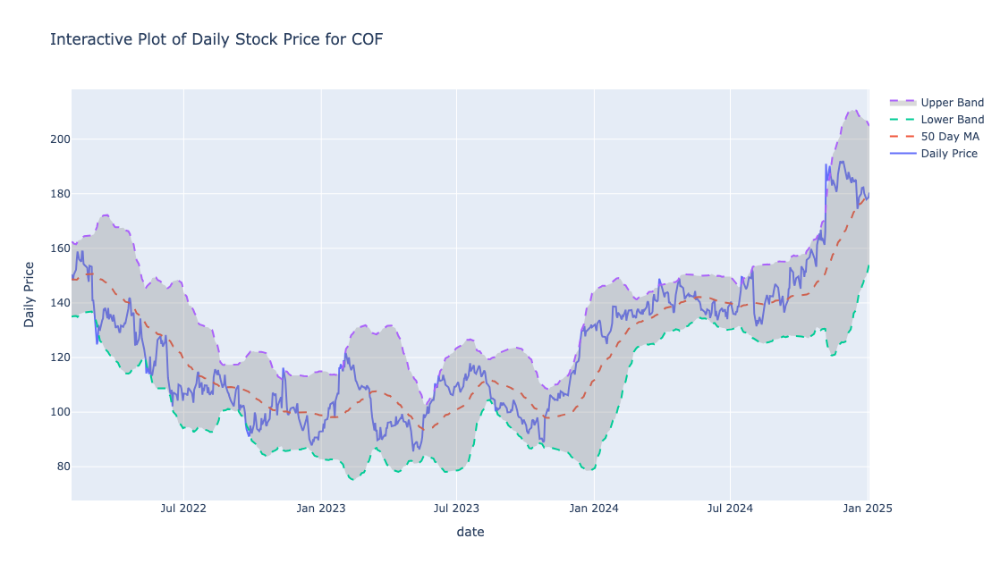

0.02585034013605442
0.014965986394557823


[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed

Current RSI: 42.15 
Current MACD Divergence: -0.44 


Tomorrow inferred RSI: 40.83 
Tomorrow inferred MACD Divergence: -0.31 


In [45]:
cof_strategy = stock_strategy('cof', start="2021-02-01")
df_check = cof_strategy.return_result()
cof_strategy.output(interactive_plot=True)
print(df_check[df_check['close']>=df_check['Upper Band - 50MA']].shape[0] / df_check.shape[0])
print(df_check[df_check['close']<=df_check['Lower Band - 50MA']].shape[0] / df_check.shape[0])
stock_strategy('cof').latest_metric()
stock_strategy('cof').infer_metric()

In [46]:
# for stock_name in ['cof', 'brk-b', 'qqq' ,'spy','tqqq', 'upro', 'BTC-USD', 'yinn','inda']:
#     df_stock = stock_strategy(stock_name, start='2021-01-01').return_result()
#     fig, ax = plt.subplots(figsize=(8, 4))
#     ax.grid(True, alpha=0.5)
#     ax.plot(df_stock['date'], df_stock['close'], label='Daily Close Price')
#     # ax.plot(df_stock['date'], df_stock['12 Day EMA'], ls='--', label='12 Day EMA')
#     ax.plot(df_stock['date'], df_stock['26 Day EMA'], ls='--', label='26 Day EMA')
#     ax.plot(df_stock['date'], df_stock['50 Day EMA'], ls='--', label='50 Day EMA')
#     ax.plot(df_stock['date'], df_stock['200 Day EMA'], ls='--', label='200 Day EMA')
#     ax.set_title('Daily stock price and EMAs for ' + stock_name.upper())
#     plt.xticks(rotation=45)
#     ax.legend()
#     plt.show()

## Regression
* Only need to check this weekly - every Tuesday

In [47]:
# df_brk = yf.download('brk-b'.upper(),
#                  start='2010-01-01',
#                  end=datetime.today())
# df_brk = df_brk.reset_index()
# df_brk['log_price'] = np.log(df_brk['Close'])

# df_brk.head()

In [48]:
# df_sub = df_brk.reset_index()
# df_sub = df_sub[df_sub['Date']>=pd.to_datetime('2020-01-01')]

# df_sub['days_since_start'] = (df_sub['Date'] - df_sub['Date'].min()).dt.days

# X = df_sub['days_since_start'].values.reshape(-1, 1)  # Feature matrix (date)
# y = np.log10(df_sub['Close']).values.reshape(-1, 1)         # Target vector (price)

# X_b = np.c_[np.ones((len(X), 1)), X]  # Add a bias term (intercept) to feature matrix
# theta_best = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

# intercept, slope = theta_best[0], theta_best[1]

# print('Annual expected return rate: ', 10**(slope*365)-1)
# print('Final price extracted:',10**(intercept + slope*df_sub.tail(1)['days_since_start'].unique()[0]))

# # Generate the fitted curve
# # days_range = np.linspace(df_sub['days_since_start'].min(), df_sub['days_since_start'].max(), 100)
# print("R2:", round(r2_score(y, (intercept + slope*df_sub['days_since_start'])),4))

# fitted_curve = 10**(intercept + slope*df_sub['days_since_start'])

# # Plot the original data and the fitted curve
# plt.figure(figsize=(10, 6))
# plt.scatter(df_sub['Date'], df_sub['Close'], label='Original Data')
# plt.plot(df_sub['Date'], fitted_curve, 'r-', label='Fitted Curve')
# plt.xlabel('Days Since Start')
# plt.ylabel('Price')
# plt.title('Exponential Curve Fitting - Linear')
# plt.legend()
# plt.grid(True)
# plt.show()


In [49]:
# df_reg = df_brk.reset_index()
# df_reg = df_reg[df_reg['Date']>=pd.to_datetime('2020-01-01')]
# df_reg['days_since_start'] = (df_reg['Date'] - df_reg['Date'].min()).dt.days

# # Assuming your DataFrame is named 'df' and contains columns 'days_since_start' and 'Close'

# # Define the exponential function
# def exponential_func(x, a, b):
#     return a * 10**(b * x)

# # Initial guess for parameters
# initial_guess = (df_reg.head(1)['Close'].unique()[0], np.log10(df_reg.tail(1)['Close'].unique()[0] / df_reg.head(1)['Close'].unique()[0])/df_reg.tail(1)['days_since_start'].unique()[0])  # You might need to adjust these initial values based on your data

# # Fit the curve
# popt, pcov = curve_fit(exponential_func, df_reg['days_since_start'], df_reg['Close'], p0=initial_guess)

# a_fit, b_fit = popt
# print('Annual expected return rate: ', 10**(b_fit*365)-1)
# print('Final price extracted:',exponential_func(df_reg.tail(1)['days_since_start'].unique()[0],a_fit, b_fit))

# # Generate the fitted curve
# # days_range = np.linspace(df_reg['days_since_start'].min(), df_reg['days_since_start'].max(), 100)
# # fitted_curve = exponential_func(days_range, *popt)
# fitted_curve = exponential_func(df_reg['days_since_start'], *popt)
# print("R2:", round(r2_score(np.log10(df_reg['Close']).values.reshape(-1, 1), (np.log10(a_fit) + b_fit*df_reg['days_since_start'])),4))

# index_start = np.where(df_reg['Close'].values >= fitted_curve)[0][0]
# print("Max diff from regression relative to regression price:", ((fitted_curve[index_start:] - df_reg['Close'].values[index_start:]) / fitted_curve[index_start:]).max())
# # Plot the original data and the fitted curve
# plt.figure(figsize=(10, 6))
# plt.scatter(df_reg['Date'], df_reg['Close'], label='Original Data')
# plt.plot(df_reg['Date'], fitted_curve, 'r-', label='Fitted Curve')
# plt.xlabel('Days Since Start')
# plt.ylabel('Price')
# plt.title('Exponential Curve Fitting')
# plt.legend()
# plt.grid(True)
# plt.show()


[*********************100%***********************]  1 of 1 completed

Annual expected return rate: 13.14%
Maximal Drawdown: -31.13%
Peak Date: 2020-01-17 00:00:00 with price 231.61
Trough Date: 2020-03-23 with price 159.5
Final price extracted: 423.03
R2: 0.9659
Maximal Drawdown from regression price relative to regression price: 30.81%


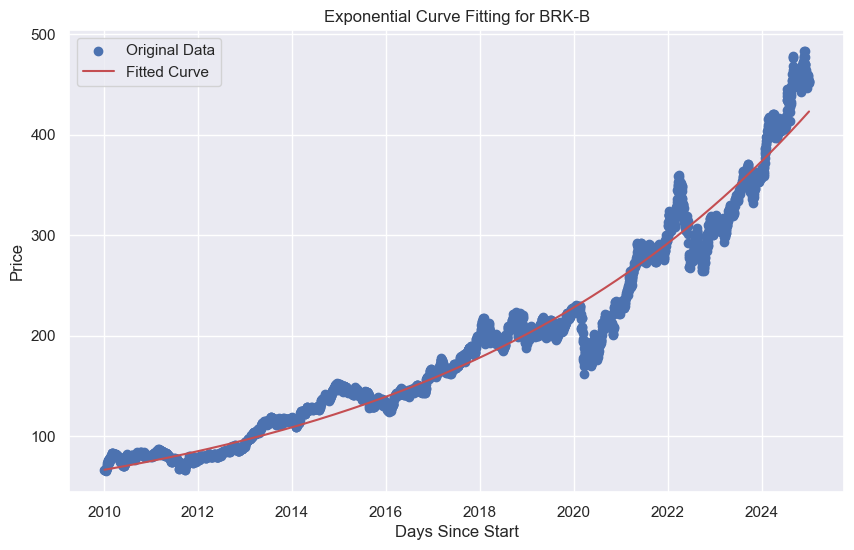

[*********************100%***********************]  1 of 1 completed


Annual expected return rate: 17.94%
Maximal Drawdown: -31.13%
Peak Date: 2020-01-17 00:00:00 with price 231.61
Trough Date: 2020-03-23 with price 159.5
Final price extracted: 454.15
R2: 0.8894
Maximal Drawdown from regression price relative to regression price: 21.35%


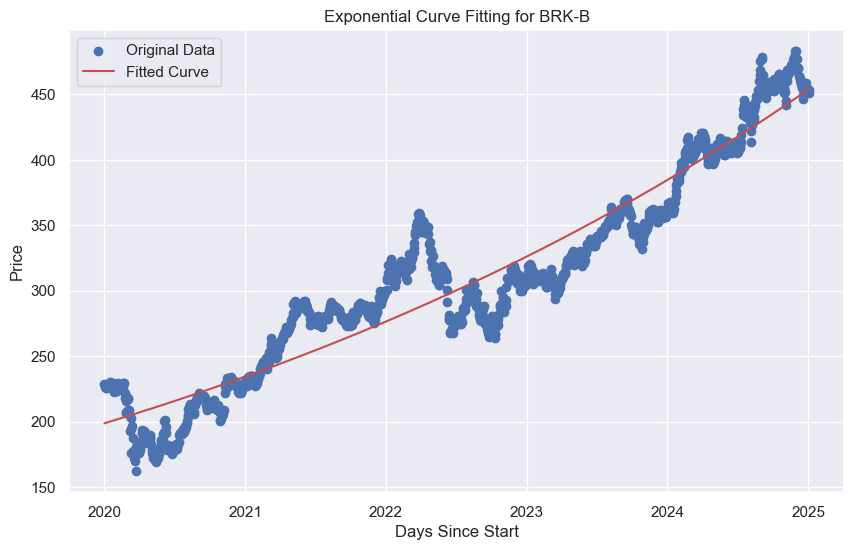

[*********************100%***********************]  1 of 1 completed

Annual expected return rate: 18.24%
Maximal Drawdown: -28.24%
Peak Date: 2022-03-29 00:00:00 with price 362.1
Trough Date: 2022-10-13 with price 259.85
Final price extracted: 455.58
R2: 0.8905
Maximal Drawdown from regression price relative to regression price: 15.80%


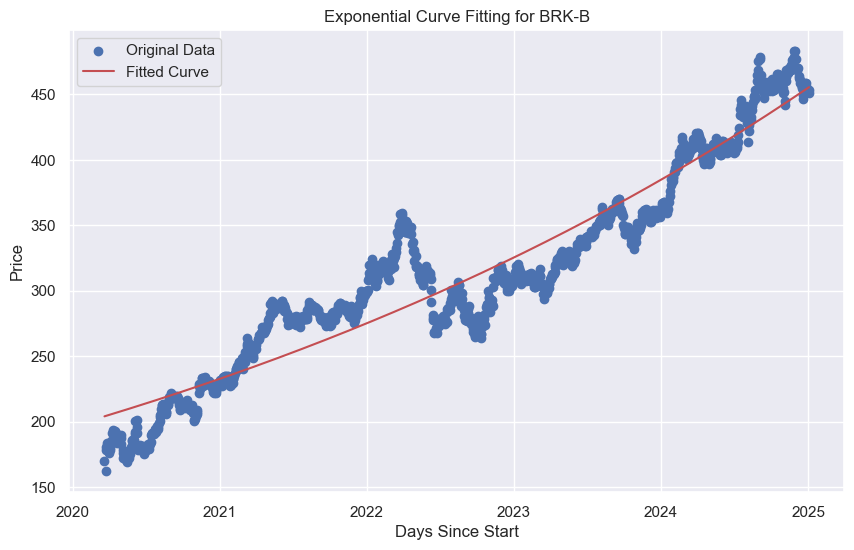

[*********************100%***********************]  1 of 1 completed

1 Failed download:
['COST']: ConnectionError(ReadTimeoutError("HTTPSConnectionPool(host='query2.finance.yahoo.com', port=443): Read timed out."))


ValueError: attempt to get argmin of an empty sequence

In [50]:
# for stock_name in [
#     'brk-b',
#     'cost',
#     'voo',
#    # 'ive', -- basically voo + brk-b
#     'abbv',
#     'xlk',
#     'xlv',
#     'unh',
#     'coke',
#     'aapl',
#    # 'fngs',
#     'msft',
#    # 'ixn', -- too high with xlk and voo
#     'race',
#    # 'dia', -- only useful as ref, not gonna buy
#     'hesay',
#    # 'qqqm',
#    # 'qqq', -- has xlk
#     'cat',
#     'axp',
#     'pg',
#    # 'xlp', -- return too low
#     'wmt',
#     'lmt',
#     'inda',
#    # 'v', -- replicate with ma
#     'ma',
#     # 'nvda', # 2010 mess; 2020 bad; QE bad
#     # 'tsla', # not regressive
#     # 'fbtc', # not regressive
#     'smh', # 2010 good, 2020 fair+, QE fair+; -47.63
#     'itb', # 2010 good -55.68, 2020 fair -55.68, QE fair -42.44
#     'googl', # 2010 good -45.01, 2020 fair -45.01, QE fair -45.01
#     'lly', # 2010 mess -30.88, 2020 good -26.85, QE good -26.85
#     'xlf', # 2010 good -44.26, 2020 bad -44.26, QE bad -29.04
#     'jpm', # 2010 good -45.49, 2020 bad -45.49, QE bad -41.44
#     'hd', # 2010 good -43.15, 2020 bad -43.15, QE bad -37.11
#     'fico', # all not good
# ]:
if datetime.today().weekday() == 1:
    for stock_name in list_base + list_swing:
        stock_regression(stock_name, detailed=True)
        stock_regression(stock_name, regression_start='2020-01-01', detailed=True)
        stock_regression(stock_name, regression_start='2020-03-20', detailed=True)
else:
    pass

### Check Correlation - only needed if multiple triggered

In [ ]:
# # No tsla, fbtc, fngs
# stock_list = [e for e in list_base + list_swing if e not in ['tsla', 'fbtc']]
# l_dfs = []

# for stock_name in stock_list:
#     df = yf.download(stock_name.upper(), start='2010-01-01', end=datetime.today().strftime('%Y-%m-%d'))
#     df = df.reset_index()
#     df.columns = df.columns.str.lower()
#     df['name'] = stock_name
#     l_dfs.append(df[['name', 'date', 'close']])

# df_all = pd.concat(l_dfs)
# pivot_df = df_all[['date','close', 'name']].pivot(index='date', columns='name', values='close')

# correlation_matrix = pivot_df.corr()

# high_correlation = correlation_matrix[correlation_matrix >= 0.9]

# plt.figure(figsize=(20, 16))
# sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
# plt.show()    

In [ ]:
# pivot_df = df_all[df_all['date']>='2020-01-01'][['date','close', 'name']].pivot(index='date', columns='name', values='close')

# correlation_matrix = pivot_df.corr()

# high_correlation = correlation_matrix[correlation_matrix >= 0.9]

# plt.figure(figsize=(20, 16))
# sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
# plt.show()

In [ ]:
# pivot_df = df_all[df_all['date']>='2020-03-20'][['date','close', 'name']].pivot(index='date', columns='name', values='close')

# correlation_matrix = pivot_df.corr()

# high_correlation = correlation_matrix[correlation_matrix >= 0.9]

# plt.figure(figsize=(20, 16))
# sns.heatmap(high_correlation, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('High Correlation Matrix (>= 0.9) of Daily Stock Prices')
# plt.show()

### Gamble - meme stocks

In [ ]:
# import requests
# from bs4 import BeautifulSoup

# # Define URL to scrape
# url = "https://finance.yahoo.com/most-active/"

# # Get the webpage content
# response = requests.get(url)
# response.raise_for_status()  # Raise exception for unsuccessful requests

# # Parse HTML content
# soup = BeautifulSoup(response.content, 'html.parser')

# # Find the container holding stock names (inspect the webpage's HTML)
# all_tables = soup.find_all('table')
# for table in all_tables:
#   # Check for presence of headers containing "Symbol", "Name", "Price" etc.
#   if any(header.text.strip() in ("Symbol", "Name", "Price") for header in table.find_all('th')):
#     stock_table = table
#     break
# stock_names = []
# if stock_table:
#   for row in stock_table.find_all('tr'):
#     name_cell = row.find('td', {'aria-label': 'Symbol'})
#     if name_cell:
#       stock_names.append(name_cell.text.strip())

# # Print the extracted list
# print(stock_names)

In [ ]:
# list_new_meme = [
# "BURU",
# "AITX",
# "STSS",
# "NSAV",
# "HMBL",
# "INKW",
# "NVDA",
# "LGVN",
# "RONN",
# "BRTX",
# "OZSC",
# "NCI",
# "WHEN",
# "IGPK",
# "KYNC",
# "DPLS",
# "ILUS",
# "TSLA",
# "BCAP",
# "CERO",
# "AAPL",
# "CYN",
# "CRKN",
# "MRVL",
# "WKHS",
# "DIDIY",
# "VLD",
# "LTNC",
# "GME",
# "AONC",
# "ENZC"
# ]

In [ ]:
# with open ('../list_meme_static', 'rb') as fp:
#     list_meme_static = pickle.load(fp)
# for e in list_new_meme:
#     if e not in list_meme_static:
#         list_meme_static.append(e)
# list_meme_static = list(set(list_meme_static))
# with open ('../list_meme_static', 'wb') as fp:
#     pickle.dump(list_meme_static, fp)

# with open ('../list_meme_static', 'rb') as fp:
#     list_meme_static = pickle.load(fp)
# print('Static meme stocks:', len(list_meme_static))

In [ ]:
# # we can pull additional meme stock below from https://www.quiverquant.com/scores/memestocks

# import requests
# from bs4 import BeautifulSoup

# def get_stock_names(url):
#   """Extracts stock names from a given URL.

#   Args:
#     url: The URL of the webpage containing the stock names.

#   Returns:
#     A list of stock names.
#   """

#   response = requests.get(url)
#   soup = BeautifulSoup(response.content, 'html.parser')

#   # Find the table containing the stock names
#   table = soup.find('table')

#   # Extract stock names from table rows
#   stock_names = []
#   for row in table.find_all('tr')[1:]:
#     cells = row.find_all('td')
#     if cells:
#       stock_names.append(cells[1].text.strip().split('\n')[0])

#   return stock_names

# # Example usage
# url = 'https://www.quiverquant.com/scores/memestocks'
# stock_names = get_stock_names(url)
# print('Added dynamically:', len(stock_names))

# # list_meme = list(set(stock_names+list_meme_static))
# list_meme = list(set(stock_names+list_new_meme))
# print('All meme stocks:', len(list_meme))


In [ ]:
# obj = stock_strategy('AMC', start=(datetime.today() - relativedelta(months=24)).strftime('%Y-%m-%d'),
#                      end=datetime.today().strftime('%Y-%m-%d'))
# obj.latest_metric(print_result=False)

# print('Volume:', obj.df['volume'].mean(), obj.ticker['Volume'][0], obj.ticker['Volume'][0] / obj.df['volume'].mean())
# print('RSI:', obj.df.tail(1)['RSI'].tolist()[0], obj.curr_rsi)
# print('MACD:', obj.df.tail(1)['MACD_diff'].tolist()[0], obj.curr_macd)
# obj.df.tail(5)

In [ ]:
# dict_meme = dict({'stock_name':[],
#                   'avg_vol':[],
#                   'curr_vol':[],
#                   'vol_ratio':[],
#                   'old_rsi':[],
#                   'old_macd':[],
#                   'curr_rsi':[],
#                   'curr_macd':[],                  
#                  })
# list_to_check1 = []
# list_to_check2 = []

# for e in list_meme:
#     try:
#         obj = stock_strategy(e,
#                              start=(datetime.today() - relativedelta(months=3)).strftime('%Y-%m-%d'),
#                              end=datetime.today().strftime('%Y-%m-%d'))
#         obj.latest_metric(print_result=False)
#         avg_vol = obj.df['volume'].mean()
#         ticker = yf.Ticker(e.upper()).history(period='1d')
#         curr_vol = ticker['Volume'][0]
#         vol_ratio = curr_vol / avg_vol
#         old_rsi = obj.df.tail(1)['RSI'].tolist()[0]
#         old_macd = obj.df.tail(1)['MACD_diff'].tolist()[0]
#         curr_rsi = obj.curr_rsi
#         curr_macd = obj.curr_macd
#         dict_meme['stock_name'].append(e)
#         dict_meme['avg_vol'].append(avg_vol)
#         dict_meme['curr_vol'].append(curr_vol)
#         dict_meme['vol_ratio'].append(vol_ratio)
#         dict_meme['old_rsi'].append(old_rsi)
#         dict_meme['old_macd'].append(old_macd)
#         dict_meme['curr_rsi'].append(curr_rsi)
#         dict_meme['curr_macd'].append(curr_macd)
#         if vol_ratio > 1 and old_rsi < 70 and curr_rsi > 50 and curr_rsi > old_rsi and curr_macd > old_macd and curr_macd > 0:
#             list_to_check1.append(e)
#         if vol_ratio > 1 and curr_rsi > 60 and curr_rsi > old_rsi and curr_macd > old_macd:
#             list_to_check2.append(e)
#     except:
# print(list_to_check1)
# print(list_to_check2)

# df_meme = pd.DataFrame(dict_meme)

In [ ]:
# # for safety, one can have curr_macd > 1.5*old_macd
# df_meme['macd_increase'] = (df_meme['curr_macd'] - df_meme['old_macd'])/df_meme['curr_macd']
# df_meme[df_meme['stock_name'].isin(list_to_check1+list_to_check2)].sort_values(by='macd_increase',ascending=False)

In [ ]:
# df_meme[(df_meme['stock_name'].isin(list_to_check1+list_to_check2)) & (df_meme['curr_macd']>1.5*df_meme['old_macd'])].sort_values(by='vol_ratio', ascending=False)

### Backup only

In [ ]:
# def get_optimum_clusters(df, saturation_point=0.05):
#     '''
#     :param df: dataframe
#     :param saturation_point: The amount of difference we are willing to detect
#     :return: clusters with optimum K centers

#     This method uses elbow method to find the optimum number of K clusters
#     We initialize different K-means with 1..10 centers and compare the inertias
#     If the difference is no more than saturation_point, we choose that as K and move on
#     '''

#     wcss = []
#     k_models = []

#     size = min(11, len(df.index))
#     for i in range(1, size):
#         kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
#         kmeans.fit(df)
#         wcss.append(kmeans.inertia_)
#         k_models.append(kmeans)

#     # Compare differences in inertias until it's no more than saturation_point
#     optimum_k = len(wcss)-1
#     for i in range(0, len(wcss)-1):
#         diff = abs(wcss[i+1] - wcss[i])
#         if diff < saturation_point:
#             optimum_k = i
#             break

#     # knee = KneeLocator(range(1, size), wcss, curve='convex', direction='decreasing')
#     # optimum_k = knee.knee

#     optimum_clusters = k_models[optimum_k]

#     return optimum_clusters

# def identify_weak_support_resistance(data):
#     # Initialize an empty list to store the labels (support, resistance, neither)
#     labels = []

#     # Iterate through the dataframe to identify weak support and weak resistance
#     for i in range(len(data)):
#         if i == 0 or i == len(data) - 1:
#             # Edge cases where there's no previous or following day
#             labels.append("neither")
#         elif data['close'][i] < data['close'][i - 1] and data['close'][i] < data['close'][i + 1]:
#             # Weak support condition
#             labels.append("weak support")
#         elif data['close'][i] > data['close'][i - 1] and data['close'][i] > data['close'][i + 1]:
#             # Weak resistance condition
#             labels.append("weak resistance")
#         else:
#             # Neither weak support nor weak resistance
#             labels.append("neither")

#     # Add the labels to a new column in the dataframe
#     data['Support/Resistance'] = labels

#     return data

In [ ]:
# def break_point_solution_bb(stock_name):
#     '''
#     Solve for the break point solution price for breaking the current MA/BB
#     stock_name: str
#     '''
#     df = yf.download(stock_name.upper(),
#                  start=(datetime.today() - relativedelta(days=100)).strftime('%Y-%m-%d'),
#                  end=datetime.today()
#                  )
#     df = df.reset_index()
#     df.columns = df.columns.str.lower()
#     # df = df[['close']]
    
#     # Define the expression whose roots we want to find
#     # fsolve is not satisfying; provide analytical solution
#     last_19day_price = df[df['date'].between(
#         (datetime.today()-relativedelta(days=19)).strftime('%Y-%m-%d'),
#         (datetime.today()-relativedelta(days=1)).strftime('%Y-%m-%d'))]['close']
#     last_49day_price = df[df['date'].between(
#         (datetime.today()-relativedelta(days=49)).strftime('%Y-%m-%d'),
#         (datetime.today()-relativedelta(days=1)).strftime('%Y-%m-%d'))]['close']

#     a1 = np.sum(last_19day_price)
#     a2 = np.sum(last_19day_price**2)
#     p_ma = np.mean(last_19day_price)
#     p_ubb = (562*a1 + np.sqrt((562*a1)**2 - 4*(5339*(99*a1**2-1600*a2))))/5339/2
#     p_lbb = (562*a1 - np.sqrt((562*a1)**2 - 4*(5339*(99*a1**2-1600*a2))))/5339/2
    
#     print('20MA break point:', round(p_ma,2))
#     print('20MA Lower Bollinger Band break point:', round(p_lbb,2))
#     print('20MA Upper Bollinger Band break point:', round(p_ubb,2))

#     a1 = np.sum(last_49day_price)
#     a2 = np.sum(last_49day_price**2)
#     p_ma = np.mean(last_49day_price)
#     p_ubb = (4177*a1 + np.sqrt((4177*a1)**2 - 4*(102336.5*(361.5*a1**2-15625*a2))))/102336.5/2
#     p_lbb = (4177*a1 - np.sqrt((4177*a1)**2 - 4*(102336.5*(361.5*a1**2-15625*a2))))/102336.5/2
    
#     print('50MA break point:', round(p_ma,2))
#     print('50MA Lower Bollinger Band break point:', round(p_lbb,2))
#     print('50MA Upper Bollinger Band break point:', round(p_ubb,2))

In [ ]:
# def plot_stock(stock_name,
#                start=(datetime.today() - relativedelta(years=3)).strftime('%Y-%m-%d'),
#                end=datetime.today(),
#                figsize=(12, 9),
#                interactive=False,
#                return_result=False,
#               ):
#     '''
#     Input:
#     stock_name: str
#     start: datetime
#     end: datetime
#     '''
#     df = yf.download(stock_name.upper(),
#                      start=start,
#                      end=end)
#     df = df.reset_index()
#     df.columns = df.columns.str.lower()

#     df['20 Day MA'] = df['close'].rolling(window=20).mean()
#     df['20 Day STD'] = df['close'].rolling(window=20).std()
#     df['Upper Band - 20MA'] = df['20 Day MA'] + (df['20 Day STD'] * 2)
#     df['Lower Band - 20MA'] = df['20 Day MA'] - (df['20 Day STD'] * 2)
#     df['50 Day MA'] = df['close'].rolling(window=50).mean()
#     df['50 Day STD'] = df['close'].rolling(window=50).std()
#     df['Upper Band - 50MA'] = df['50 Day MA'] + (df['50 Day STD'] * 2.5)
#     df['Lower Band - 50MA'] = df['50 Day MA'] - (df['50 Day STD'] * 2.5)
    
#     yesterday = (datetime.today() - relativedelta(days=1)).strftime('%Y-%m-%d')
#     close = df[df['date']==yesterday]['close'].item()
#     print('* previous stock price closing', round(close,2))
#     print("Latest 20 Day MA:", round(df[df['date']==yesterday]['20 Day MA'].item(), 2))
#     print("Latest Lower Bollinger Band, 20MA:", round(df[df['date']==yesterday]['Lower Band - 20MA'].item(), 2))
#     print("Latest Higher Bollinger Band, 20MA:", round(df[df['date']==yesterday]['Upper Band - 20MA'].item(), 2))
#     print("Latest 50 Day MA:", round(df[df['date']==yesterday]['50 Day MA'].item(), 2))
#     print("Latest Lower Bollinger Band, 50MA:", round(df[df['date']==yesterday]['Lower Band - 50MA'].item(), 2))
#     print("Latest Higher Bollinger Band, 50MA:", round(df[df['date']==yesterday]['Upper Band - 50MA'].item(), 2))
#     print()

#     # Calculate RSI
#     delta = df['close'].diff()
#     gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
#     loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
#     rs = gain / loss
#     df['RSI'] = 100 - (100 / (1 + rs))
#     latest_rsi = round(df[df['date']==yesterday]['RSI'].item(), 2)
#     if latest_rsi > 70:
#         print("Latest RSI:", Fore.RED + str(latest_rsi), Style.RESET_ALL)
#     elif latest_rsi < 30:
#         print("Latest RSI:", Fore.GREEN + str(latest_rsi), Style.RESET_ALL)
#     else:
#         print("Latest RSI:", latest_rsi, Style.RESET_ALL)

#     # Calculate MACD
#     df['12 Day EMA'] = df['close'].ewm(span=12, adjust=False).mean()
#     df['26 Day EMA'] = df['close'].ewm(span=26, adjust=False).mean()
#     df['MACD'] = df['12 Day EMA'] - df['26 Day EMA']
#     df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
#     latest_macd = round(df[df['date']==yesterday]['MACD'].item() - df[df['date']==yesterday]['MACD_signal'].item(), 2)
#     if latest_macd < 0:
#         print("Latest MACD Divergence:", Fore.RED + str(latest_macd), Style.RESET_ALL)
#     elif latest_macd > 0:
#         print("Latest MACD Divergence:", Fore.GREEN + str(latest_macd), Style.RESET_ALL)
#     else:
#         print("Latest MACD Divergence:", Fore.BLACK + str(latest_macd), Style.RESET_ALL)

#     break_point_solution_bb(stock_name)
#     # df = identify_weak_support_resistance(df)
    
#     # low_clusters = get_optimum_clusters(df[df['Support/Resistance']=='weak support'][['date',"close"]].set_index('date'))
#     # low_centers = low_clusters.cluster_centers_
#     # low_centers = np.sort(low_centers, axis=0)
    
#     # high_clusters = get_optimum_clusters(df[df['Support/Resistance']=='weak resistance'][['date',"close"]].set_index('date'))
#     # high_centers = high_clusters.cluster_centers_
#     # high_centers = np.sort(high_centers, axis=0)
    
#     # print('Supports')
#     # print([low[0] for low in low_centers[:]])
#     # print('Resistance')
#     # print([high[0] for high in high_centers[:]])

#     df_plot = df[df['date'] >= df['date'].min() + relativedelta(years=1)]
#     if interactive:
#         fig = go.Figure(layout=dict(width=figsize[0]*80, height=figsize[1]*80))
        
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['close'], name='Daily Price'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['50 Day MA'], mode='lines', line=dict(dash='dash'), name='50 Day MA'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['Lower Band - 50MA'], mode='lines', line=dict(dash='dash'), name='Lower Band'))
#         fig.add_trace(go.Scatter(x=df_plot['date'], y=df_plot['Upper Band - 50MA'], mode='lines', line=dict(dash='dash'), name='Upper Band', fill='tonexty', fillcolor='rgba(128,128,128,0.3)'))
        
#         # for low in low_centers[:]:
#         #     fig.add_trace(go.Scatter(x=df['date'], y=[low[0]]*len(df['date']), mode='lines', line=dict(color='green', dash='dash'), name='Support at ' + str(low[0])))
#         # for high in high_centers[:]:
#         #     fig.add_trace(go.Scatter(x=df['date'], y=[high[0]]*len(df['date']), mode='lines', line=dict(color='red', dash='dash'), name='Resistance at ' + str(high[0])))        
#         fig.update_layout(title='Interactive Plot of Daily Stock Price for ' + stock_name,
#                           xaxis_title='date',
#                           yaxis_title='Daily Price',
#                           hovermode='closest')
        
#         # Add ability to select a single data point
#         fig.update_traces(marker=dict(size=10, opacity=0.8),
#                           selector=dict(mode='markers'))
        
#         fig.show()
#     else:
#         # fig, ax = plt.subplots(figsize=figsize)
#         fig, (ax1, ax2) = plt.subplots(2, 1, figsize=figsize, gridspec_kw={'height_ratios': [2, 1]}, sharex=True)
#         ax1.grid(True, alpha=0.5)
#         ax1.plot(df_plot['date'], df_plot['close'], label='Daily Close Price')
#         ax1.plot(df_plot['date'], df_plot['50 Day MA'], ls='--', label='50 Day Moving Average')
#         ax1.plot(df_plot['date'], df_plot['Upper Band - 50MA'], ls='--', label='Upper Bollinger Band, 50MA')
#         ax1.plot(df_plot['date'], df_plot['Lower Band - 50MA'], ls='--', label='Lower Bollinger Band, 50MA')
#         ax1.fill_between(df_plot['date'], df_plot['Upper Band - 50MA'], df_plot['Lower Band - 50MA'], color='gray', alpha=0.3) # Fill the area between the bands
#         ax1.set_title('Daily stock price for ' + stock_name.upper())
#         ax1.legend()
            
#         # Plot MACD and signal line, color bars based on MACD above/below signal line
#         ax2.plot(df_plot['date'], df_plot['MACD'], label='MACD', color='red')
#         ax2.plot(df_plot['date'], df_plot['MACD_signal'], label='Signal Line', linestyle='--', color='blue')
#         bar_colors = ['green' if macd > signal else 'red' for macd, signal in zip(df_plot['MACD'], df_plot['MACD_signal'])]
#         ax2.bar(df_plot['date'], df_plot['MACD'] - df_plot['MACD_signal'], width=1.5, align='center', color=bar_colors)        
#         ax2.set_title('MACD')
#         ax2.legend()
#         fig.suptitle('MACD Analysis', fontsize=16)
#         fig.subplots_adjust(hspace=0.05)  # Reduce vertical space between subplots
#         plt.xticks(rotation=45) 
        
#         plt.tight_layout()
#         plt.show()
#         # for low in low_centers[:]:
#     	   #  ax.axhline(low[0], color='green', ls='--')
#         # for high in high_centers[:]:
#     	   #  ax.axhline(high[0], color='red', ls='--')

#     if return_result:
#         return df

In [ ]:
# plot_stock('voo')

In [ ]:
# df_cof = plot_stock('cof', start="2022-02-01", return_result=True, interactive=True)
# print(df_cof[df_cof['close']>=df_cof['Upper Band - 50MA']].shape[0] / df_cof.shape[0])
# print(df_cof[df_cof['close']<=df_cof['Lower Band - 50MA']].shape[0] / df_cof.shape[0])